Train data:  (50000, 32, 32, 3)
Train filenames:  (50000,)
Train labels:  (50000,)
Test data:  (10000, 32, 32, 3)
Test filenames:  (10000,)
Test labels:  (10000,)
Label names:  (10,)


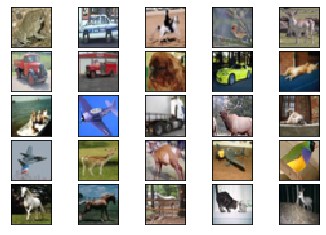

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pickle

"""
The CIFAR-10 dataset consists of 60000 32x32 colour images in 10 classes, with 6000 images per class. There are 50000 
training images and 10000 test images.
The dataset is divided into five training batches and one test batch, each with 10000 images. The test batch contains 
exactly 1000 randomly-selected images from each class. The training batches contain the remaining images in random 
order, but some training batches may contain more images from one class than another. Between them, the training 
batches contain exactly 5000 images from each class.
"""


def unpickle(file):
    """load the cifar-10 data"""

    with open(file, 'rb') as fo:
        data = pickle.load(fo, encoding='bytes')
    return data


def load_cifar_10_data(data_dir, negatives=False):
    """
    Return train_data, train_filenames, train_labels, test_data, test_filenames, test_labels
    """

    # get the meta_data_dict
    # num_cases_per_batch: 1000
    # label_names: ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']
    # num_vis: :3072

    meta_data_dict = unpickle(data_dir + "/batches.meta")
    cifar_label_names = meta_data_dict[b'label_names']
    cifar_label_names = np.array(cifar_label_names)

    # training data
    cifar_train_data = None
    cifar_train_filenames = []
    cifar_train_labels = []

    # cifar_train_data_dict
    # 'batch_label': 'training batch 5 of 5'
    # 'data': ndarray
    # 'filenames': list
    # 'labels': list

    for i in range(1, 6):
        cifar_train_data_dict = unpickle(data_dir + "/data_batch_{}".format(i))
        if i == 1:
            cifar_train_data = cifar_train_data_dict[b'data']
        else:
            cifar_train_data = np.vstack((cifar_train_data, cifar_train_data_dict[b'data']))
        cifar_train_filenames += cifar_train_data_dict[b'filenames']
        cifar_train_labels += cifar_train_data_dict[b'labels']

    cifar_train_data = cifar_train_data.reshape((len(cifar_train_data), 3, 32, 32))
    if negatives:
        cifar_train_data = cifar_train_data.transpose(0, 2, 3, 1).astype(np.float32)
    else:
        cifar_train_data = np.rollaxis(cifar_train_data, 1, 4)
    cifar_train_filenames = np.array(cifar_train_filenames)
    cifar_train_labels = np.array(cifar_train_labels)

    # test data
    # cifar_test_data_dict
    # 'batch_label': 'testing batch 1 of 1'
    # 'data': ndarray
    # 'filenames': list
    # 'labels': list

    cifar_test_data_dict = unpickle(data_dir + "/test_batch")
    cifar_test_data = cifar_test_data_dict[b'data']
    cifar_test_filenames = cifar_test_data_dict[b'filenames']
    cifar_test_labels = cifar_test_data_dict[b'labels']

    cifar_test_data = cifar_test_data.reshape((len(cifar_test_data), 3, 32, 32))
    if negatives:
        cifar_test_data = cifar_test_data.transpose(0, 2, 3, 1).astype(np.float32)
    else:
        cifar_test_data = np.rollaxis(cifar_test_data, 1, 4)
    cifar_test_filenames = np.array(cifar_test_filenames)
    cifar_test_labels = np.array(cifar_test_labels)

    return cifar_train_data, cifar_train_filenames, cifar_train_labels, \
        cifar_test_data, cifar_test_filenames, cifar_test_labels, cifar_label_names


if __name__ == "__main__":
    """show it works"""

    cifar_10_dir = 'cifar-10-batches-py'

    train_data, train_filenames, train_labels, test_data, test_filenames, test_labels, label_names = \
        load_cifar_10_data(cifar_10_dir)

    print("Train data: ", train_data.shape)
    print("Train filenames: ", train_filenames.shape)
    print("Train labels: ", train_labels.shape)
    print("Test data: ", test_data.shape)
    print("Test filenames: ", test_filenames.shape)
    print("Test labels: ", test_labels.shape)
    print("Label names: ", label_names.shape)

    # Don't forget that the label_names and filesnames are in binary and need conversion if used.

    # display some random training images in a 25x25 grid
    num_plot = 5
    f, ax = plt.subplots(num_plot, num_plot)
    for m in range(num_plot):
        for n in range(num_plot):
            idx = np.random.randint(0, train_data.shape[0])
            ax[m, n].imshow(train_data[idx])
            ax[m, n].get_xaxis().set_visible(False)
            ax[m, n].get_yaxis().set_visible(False)
    f.subplots_adjust(hspace=0.1)
    f.subplots_adjust(wspace=0)
    plt.show()

In [2]:
label_name = []
for i in range(len(label_names)):
    lbl = str(label_names[i],'utf-8')
    label_name.append(lbl)
    
print(label_name)

['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']


In [3]:
Data = np.concatenate((train_data,test_data))
labels = np.concatenate((train_labels,test_labels))
print(Data.shape)
print(labels.shape)

(60000, 32, 32, 3)
(60000,)


In [4]:
from sklearn.utils import shuffle
Data, labels = shuffle(Data, labels)

In [5]:
data_cnn = Data[:30000]
labels_cnn = labels[:30000]
print(data_cnn.shape)
print(labels_cnn.shape)
data_kmeans = Data[30000:]
labels_kmeans = labels[30000:]
print(data_kmeans.shape)
print(labels_kmeans.shape)

(30000, 32, 32, 3)
(30000,)
(30000, 32, 32, 3)
(30000,)


In [6]:
ntrain_batches = 100 #number of batches for training (hyperparameter)

data_cnn_batches = np.split(data_cnn,ntrain_batches,axis=0)
labels_cnn_batches = np.split(labels_cnn,ntrain_batches,axis=0)

data_cnnb = np.array(data_cnn_batches)
labels_cnnb = np.array(labels_cnn_batches)

In [7]:
import tensorflow.compat.v1 as tf
tf.disable_v2_behavior()
# Remove previous weights, bias, inputs, etc..
tf.reset_default_graph()

# Inputs
X = tf.placeholder("float",shape=[None,32,32,3], name='input_x')
Y = tf.placeholder(tf.int32,shape = [None], name='output_y')
prob = tf.placeholder_with_default(1.0,shape=(), name='keep_prob')

Instructions for updating:
non-resource variables are not supported in the long term


In [8]:
#Convolution layer1
W1 = tf.Variable(tf.truncated_normal(shape=[3,3,3,64], mean=0.0, stddev=0.03), name = 'weight1')
b1 = tf.Variable((0.01*tf.ones([64])),name = 'bias1')
conv1 = tf.nn.conv2d(X, W1, [1, 1, 1, 1], padding='SAME')
conv1_bd = tf.nn.bias_add(conv1, b1)
conv1_bn = tf.nn.lrn(conv1_bd, 4, bias=1.0, alpha=0.001 / 9.0, beta=0.75,name='norm1')
conv1_rl = tf.nn.relu(conv1_bn)
conv1_pool = tf.nn.max_pool(conv1_rl, ksize=[1,2,2,1], strides=[1,2,2,1], padding='SAME')

#Convolution layer2
W2 = tf.Variable(tf.truncated_normal(shape=[3,3,64,128], mean=0.0, stddev=0.03), name = 'weight2')
b2 = tf.Variable((0.01*tf.ones([128])),name = 'bias2')
conv2 = tf.nn.conv2d(conv1_pool, W2, [1, 1, 1, 1], padding='SAME')
conv2_bd = tf.nn.bias_add(conv2, b2)
conv2_bn = tf.nn.lrn(conv2_bd, 4, bias=1.0, alpha=0.001 / 9.0, beta=0.75,name='norm2')
conv2_rl = tf.nn.relu(conv2_bn)
conv2_pool = tf.nn.max_pool(conv2_rl, ksize=[1,2,2,1], strides=[1,2,2,1], padding='SAME')

#Convolution layer3
W3 = tf.Variable(tf.truncated_normal(shape=[3,3,128,256], mean=0.0, stddev=0.03), name = 'weight3')
b3 = tf.Variable((0.01*tf.ones([256])),name = 'bias3')
conv3 = tf.nn.conv2d(conv2_pool, W3, [1, 1, 1, 1], padding='SAME')
conv3_bd = tf.nn.bias_add(conv3, b3)
conv3_bn = tf.nn.lrn(conv3_bd, 4, bias=1.0, alpha=0.001 / 9.0, beta=0.75,name='norm3')
conv3_rl = tf.nn.relu(conv3_bn)
conv3_pool = tf.nn.max_pool(conv3_rl, ksize=[1,2,2,1], strides=[1,2,2,1], padding='SAME')

#Fully connected layer1
gts = conv3_pool.get_shape()
dim = gts[1]*gts[2]*gts[3]
dime = dim.value
reshp = tf.reshape(conv3_pool, [-1,dime],name = 'features')
W4 = tf.Variable(tf.truncated_normal(shape=[dime,512], mean=0.0, stddev=0.03), name = 'weight4')
b4 = tf.Variable((0.01*tf.ones([512])),name = 'bias4')
fc1 = tf.nn.relu(tf.matmul(reshp, W4) + b4)
fc1dr = tf.nn.dropout(fc1,prob)

#Fully connected layer2
W5 = tf.Variable(tf.truncated_normal(shape=[512,4096], mean=0.0, stddev=0.03), name = 'weight5')
b5 = tf.Variable((0.01*tf.ones([4096])),name = 'bias5')
fc2 = tf.nn.relu(tf.matmul(fc1dr, W5)+b5, name='fc2')
fc2dr = tf.nn.dropout(fc2,prob)

#Fully connected layer3
W6 = tf.Variable(tf.random.uniform(shape=[4096,10], minval=-1, maxval=1), name = 'weight6')
b6 = tf.Variable(tf.zeros([10]),name = 'bias6')
fc3 = tf.add(tf.matmul(fc2dr, W6),b6)

#Softmax activation
ypr = tf.nn.softmax(fc3)
model = tf.identity(ypr, name='ypr')

Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


In [9]:
#Hyperparameters
wd = 0.01  
learning_rate = 0.001
keep_prob = 0.5
epoch = 20
epsilon = 1e-3

In [10]:
wdls = 0.5*wd*(tf.nn.l2_loss(W1)+tf.nn.l2_loss(W2)+tf.nn.l2_loss(W3)+tf.nn.l2_loss(W4)
               +tf.nn.l2_loss(W5)+tf.nn.l2_loss(W6))
    
loss = tf.nn.sparse_softmax_cross_entropy_with_logits(labels=Y, logits=fc3, name='cross_entropy_per_example')
loss_mean = tf.reduce_mean(loss) + wdls
model2 = tf.identity(loss_mean, name='mean_loss')

optimizer = tf.train.AdamOptimizer(learning_rate=learning_rate,epsilon=epsilon).minimize(loss_mean)

#Accuracy
correct_pred = tf.equal(tf.argmax(input=ypr, axis=1, output_type=tf.int32), Y)
accuracy = tf.reduce_mean(tf.cast(correct_pred, tf.float32), name='accuracy')

In [11]:
saver = tf.train.Saver();
init = tf.global_variables_initializer()

with tf.Session() as session:
    session.run(init)
    loss = []
    train_acc = []
    epoch_pos = []
    for step in range(epoch):
        for i in range(ntrain_batches):
            session.run(optimizer,feed_dict={X: data_cnnb[i], Y: labels_cnnb[i], prob: 0.5})
            if i % 25 == 0:
                ls = session.run(loss_mean,feed_dict={X: data_cnnb[i], Y: labels_cnnb[i]})
                tracc = 100*(session.run(accuracy,feed_dict={X: data_cnnb[i], Y: labels_cnnb[i]}))
                epps = step + ((i+1)/ntrain_batches)
                loss.append(ls)
                train_acc.append(tracc)
                epoch_pos.append(epps)
                print('{} batches done'.format(i))
        print('Epoch {}'.format(step))
    save_path = saver.save(session,r"C:\Users\rahul\Google Drive\Rahul\Courses\ECE219\Project_2\Model\model2.ckpt")

0 batches done
25 batches done
50 batches done
75 batches done
Epoch 0
0 batches done
25 batches done
50 batches done
75 batches done
Epoch 1
0 batches done
25 batches done
50 batches done
75 batches done
Epoch 2
0 batches done
25 batches done
50 batches done
75 batches done
Epoch 3
0 batches done
25 batches done
50 batches done
75 batches done
Epoch 4
0 batches done
25 batches done
50 batches done
75 batches done
Epoch 5
0 batches done
25 batches done
50 batches done
75 batches done
Epoch 6
0 batches done
25 batches done
50 batches done
75 batches done
Epoch 7
0 batches done
25 batches done
50 batches done
75 batches done
Epoch 8
0 batches done
25 batches done
50 batches done
75 batches done
Epoch 9
0 batches done
25 batches done
50 batches done
75 batches done
Epoch 10
0 batches done
25 batches done
50 batches done
75 batches done
Epoch 11
0 batches done
25 batches done
50 batches done
75 batches done
Epoch 12
0 batches done
25 batches done
50 batches done
75 batches done
Epoch 13
0 

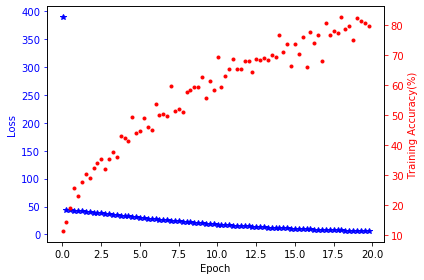

In [12]:
fig, ax1 = plt.subplots()
ax1.plot(epoch_pos, loss, 'b*')
ax1.set_xlabel('Epoch')
# Make the y-axis label, ticks and tick labels match the line color.
ax1.set_ylabel('Loss', color='b')
ax1.tick_params('y', colors='b')

ax2 = ax1.twinx()
ax2.plot(epoch_pos,train_acc, 'r.')
ax2.set_ylabel('Training Accuracy(%)', color='r')
ax2.tick_params('y', colors='r')

fig.tight_layout()
plt.show()

In [7]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelBinarizer

def display_image_predictions(features, labels, predictions, n_samples=1,top_n_predictions=1):
    n_classes = 10
    label_names = label_name
    #label_binarizer = LabelBinarizer()
    #label_binarizer.fit(range(n_classes))
    #label_ids = label_binarizer.transform(labels)
    label_ids = labels

    fig, axies = plt.subplots(nrows=n_samples, ncols=2, figsize=(20, 10))
    fig.tight_layout()
    fig.suptitle('Softmax Predictions', fontsize=20, y=1.1)

    n_predictions = top_n_predictions
    margin = 0.05
    ind = np.arange(n_predictions)
    width = (1. - 2. * margin) / n_predictions
   
    
    for i in range(n_samples):                                    
        pred_names = [label_names[pred_i] for pred_i in predictions.indices[i]]
        correct_name = label_names[label_ids[i]]
        if n_samples==1:
            axies[0].imshow(features[i].astype(np.int32, copy=False))
            axies[0].set_title(correct_name)
            axies[0].set_axis_off()

            axies[1].barh(ind + margin, predictions.values[i][:n_predictions], width)
            axies[1].set_yticks(ind + margin)
            axies[1].set_yticklabels(pred_names[:n_predictions])
            axies[1].set_xticks([0, 0.5, 1.0])
        else:
            axies[i,0].imshow(features[i].astype(np.int32, copy=False))
            axies[i,0].set_title(correct_name)
            axies[i,0].set_axis_off()

            axies[i,1].barh(ind + margin, predictions.values[i][:n_predictions], width)
            axies[i,1].set_yticks(ind + margin)
            axies[i,1].set_yticklabels(pred_names[:n_predictions])
            axies[i,1].set_xticks([0, 0.5, 1.0])

Instructions for updating:
non-resource variables are not supported in the long term
INFO:tensorflow:Restoring parameters from C:\Users\rahul\Google Drive\Rahul\Courses\ECE219\Project_2\Model\model2.ckpt
Test Accuracy : 71.96333309014638 %


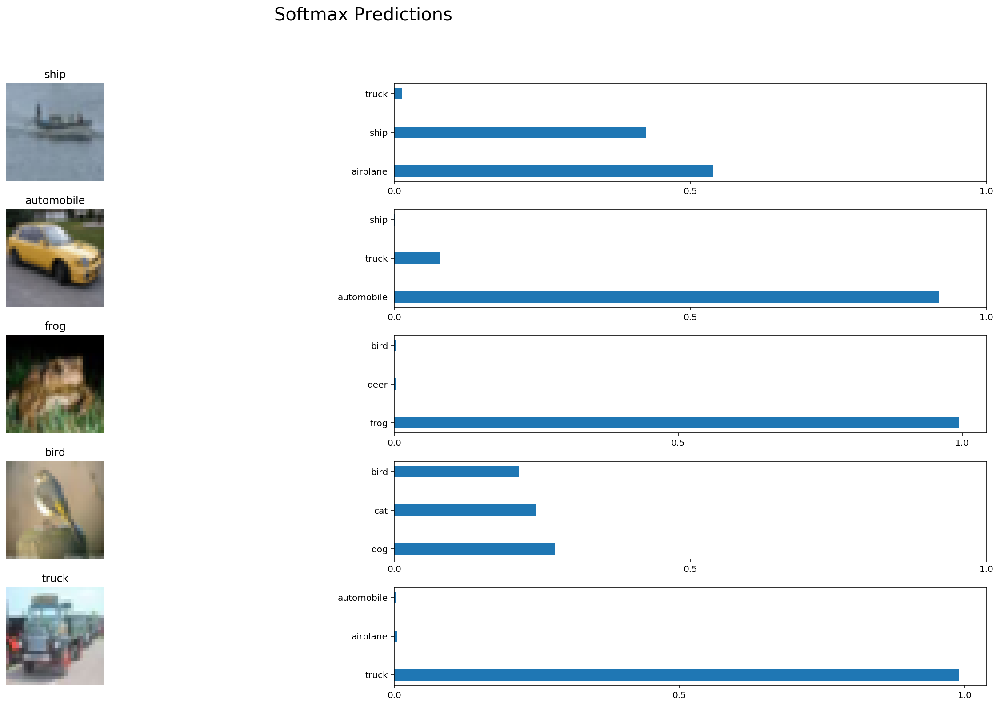

In [8]:
data_kmeansb = np.array(data_kmeans)
labels_kmeansb = np.array(labels_kmeans)

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import tensorflow.compat.v1 as tf
tf.disable_v2_behavior()
import random
config = tf.ConfigProto()
config.gpu_options.allow_growth = True

n_samples = 5
top_n_predictions = 3


loaded_graph = tf.Graph()
save_model_path = r"C:\Users\rahul\Google Drive\Rahul\Courses\ECE219\Project_2\Model\model2.ckpt"
with tf.Session(graph=loaded_graph,config=config) as sess:
    # Load model
    loader = tf.train.import_meta_graph(save_model_path + '.meta')
    loader.restore(sess, save_model_path)

    # Get Tensors from loaded model
    loaded_x = loaded_graph.get_tensor_by_name('input_x:0')
    loaded_y = loaded_graph.get_tensor_by_name('output_y:0')
    loaded_ypr = loaded_graph.get_tensor_by_name('ypr:0')
    loaded_acc = loaded_graph.get_tensor_by_name('accuracy:0')
    loaded_features = loaded_graph.get_tensor_by_name('fc2:0')
    testacc_arr = []
    features_kmeans_arr = []
    index = np.arange(0,30000,1000)
    for ii in index:
        testacc1 = 100*(sess.run(loaded_acc,feed_dict={loaded_x: data_kmeansb[ii:(ii+1000)], loaded_y: labels_kmeansb[ii:(ii+1000)]}))
        features_kmeans1 = (sess.run(loaded_features,feed_dict={loaded_x: data_kmeans[ii:(ii+1000)], loaded_y: labels_kmeans[ii:(ii+1000)]}))
        testacc_arr.append(testacc1)
        features_kmeans_arr.append(features_kmeans1)
    labels_features = labels_kmeans
    features_kmeans = np.concatenate(features_kmeans_arr,axis=0)
    print("Test Accuracy : {} %".format(np.mean(np.array(testacc_arr))))

    # Print Random Samples
    random_test_features, random_test_labels = tuple(zip(*random.sample(list(zip(data_kmeansb.astype(dtype=np.uint8)
                                                                                 , labels_kmeansb)), n_samples)))
    random_test_features2 = np.asarray(random_test_features).astype(dtype = "float")
    random_test_labels2 = np.asarray(random_test_labels)
    random_test_predictions = sess.run(tf.nn.top_k(loaded_ypr,top_n_predictions)
                                       ,feed_dict={loaded_x: random_test_features2, loaded_y: random_test_labels2})
    display_image_predictions(random_test_features, random_test_labels, random_test_predictions, n_samples,top_n_predictions)


In [13]:
from matplotlib import pyplot as plt
import numpy as np
from numpy import array

from sklearn import metrics
from sklearn.cluster import KMeans
from sklearn.decomposition import TruncatedSVD
from sklearn.decomposition import NMF

from sklearn import preprocessing

import time
import itertools

import pickle

def plot_contingency_table(cm, title='Contingency Table',
                           cmap=plt.cm.YlGnBu,
                           actual_class_names=['Class 1', 'Class 2'],
                           cluster_class_names=['Cluster 1', 'Cluster 2']):
    plt.gcf().clear()
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title, fontsize=16)
    plt.colorbar()
    tick_marks = np.arange(len(actual_class_names))
    plt.xticks(tick_marks, actual_class_names)
    plt.yticks(tick_marks, cluster_class_names)

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center")

    plt.tight_layout()
    plt.ylabel('Cluster Class', fontsize=12)
    plt.xlabel('Actual Class', fontsize=12)
    plt.show()
    
def k_means_clustering(training_data,
                       target_set,
                       n_clusters=8,
                       random_state=None,
                       max_iter=300,
                       n_init=10,
                       actual_class_names=['Class 1', 'Class 2'],
                       cluster_class_names=['Cluster 1', 'Cluster 2'],
                       show_contin=True):
    
    km = KMeans(n_clusters=n_clusters,random_state=random_state,max_iter=max_iter,n_init=n_init)
    km.fit(training_data)

    contin_matrix = metrics.cluster.contingency_matrix(target_set, km.labels_)
    print("Show Contingency Matrix:")
    
    if show_contin:
        plot_contingency_table(contin_matrix, actual_class_names=actual_class_names, cluster_class_names=cluster_class_names)
    
    print("Report 5 Measures for K-Means Clustering")
    
    homogeneity = metrics.homogeneity_score(target_set, km.labels_)
    completeness = metrics.completeness_score(target_set, km.labels_)
    v_measure = metrics.v_measure_score(target_set, km.labels_)
    adjusted_rand_index = metrics.adjusted_rand_score(target_set, km.labels_)
    adjusted_mutual_info = metrics.adjusted_mutual_info_score(target_set, km.labels_)

    print("Homogeneity Score: %f" % homogeneity)
    print("Completeness Score: %f" % completeness)
    print("V-Measure Score: %f" % v_measure)
    print("Adjusted Rand Index: %f" % adjusted_rand_index)
    print("Adjusted Mutual Information: %f" % adjusted_mutual_info)
    
    results = {
        "homogeneity": homogeneity,
        "completeness": completeness,
        "v_measure": v_measure,
        "adjusted_rand_index": adjusted_rand_index,
        "adjusted_mutual_info": adjusted_mutual_info }
    
    return results, km

def svd_dimension_reduction(training_data, n_components=2):
    svd = TruncatedSVD(n_components = n_components)
    svd_dataset = svd.fit_transform(training_data)
    return svd_dataset , svd

def nmf_dimension_reduction(training_data, n_components=None):
    nmf = NMF(n_components=n_components, random_state=0)
    nmf_dataset = nmf.fit_transform(training_data)
    return nmf_dataset , nmf


def plot_scores(method, measure, ydata, x_labels = ['1', '2', '3', '5', '10', '20', '50', '100', '300'], 
                   height=range(1,10),xtickangle=0):
    plt.gcf().clear()
    fig, ax = plt.subplots()
    ax.set_xticks([i+0.25 for i in height])
    ax.set_xticklabels(x_labels, fontsize = 12)
    
    rects = plt.bar([i for i in height], ydata, 0.5, align='edge', alpha = 0.8)
    plt.xlabel('Number of Principal Components r', fontsize = 14)
    plt.ylabel('Measure Score', fontsize = 14)
    plt.title(measure+' ('+method+')', fontsize = 18)
    plt.axis([0.5,len(x_labels)+1,0,1])
    
    plt.xticks(rotation=xtickangle)
    
    for rect in rects:
        height = rect.get_height()
        ax.text(rect.get_x() + rect.get_width()/2., 1*height, '%.3f' % float(height), ha='center', va='bottom',rotation=90)
    
    plt.show()   
    
def scatter_plot(k_means_object, clustering_result, ground_truth_dataset, title_name = ''):
    plt.gcf().clear()
    fig = plt.figure(figsize=(12,6))
    ax1 = fig.add_subplot(1,2,1)
    ax2 = fig.add_subplot(1,2,2)
    ax1.scatter(x=clustering_result[:,0], y=clustering_result[:,1], c=k_means_object.labels_, edgecolors='k', linewidth=0.25, s=30, cmap=plt.get_cmap('tab20'),vmin=0, vmax=20, alpha=0.5)    
    ax1.set_title('Clustering Result')

    ax2.scatter(x=clustering_result[:,0], y=clustering_result[:,1], c=ground_truth_dataset, edgecolors='k', linewidth=0.25, s=30, cmap=plt.get_cmap('tab20'),vmin=0, vmax=20, alpha=0.5)
    ax2.set_title('Ground Truth')
    fig.suptitle(f'{title_name} Visualization')
    plt.show()

Show Contingency Matrix:


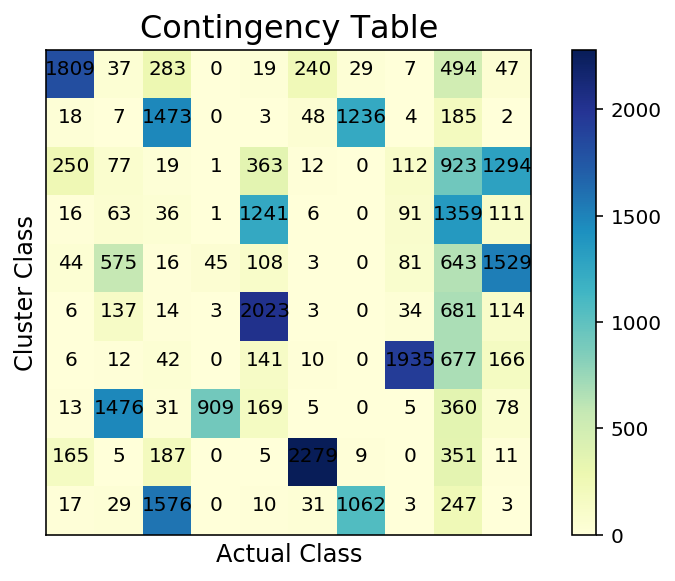

Report 5 Measures for K-Means Clustering
Homogeneity Score: 0.464275
Completeness Score: 0.482814
V-Measure Score: 0.473363
Adjusted Rand Index: 0.309213
Adjusted Mutual Information: 0.473048


In [12]:
#Without dimensionality reduction
k_means_ndr, km_ndr = k_means_clustering(features_kmeans, labels_features, n_clusters=10,random_state=0, actual_class_names=[], cluster_class_names=[])

n_components: 50
Show Contingency Matrix:


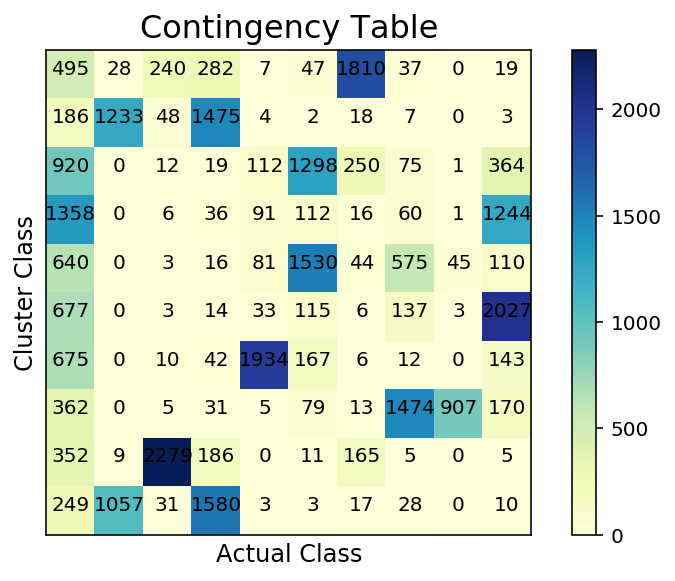

Report 5 Measures for K-Means Clustering
Homogeneity Score: 0.464276
Completeness Score: 0.482877
V-Measure Score: 0.473394
Adjusted Rand Index: 0.309272
Adjusted Mutual Information: 0.473078



n_components: 150
Show Contingency Matrix:


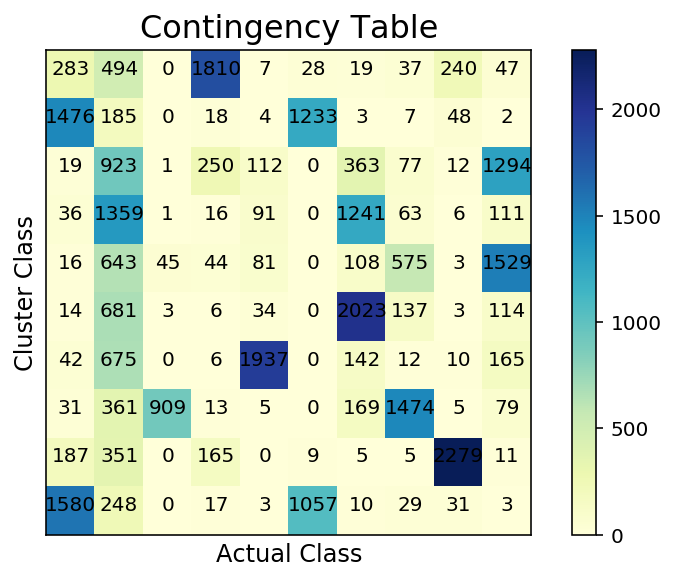

Report 5 Measures for K-Means Clustering
Homogeneity Score: 0.464257
Completeness Score: 0.482823
V-Measure Score: 0.473358
Adjusted Rand Index: 0.309243
Adjusted Mutual Information: 0.473043



n_components: 250
Show Contingency Matrix:


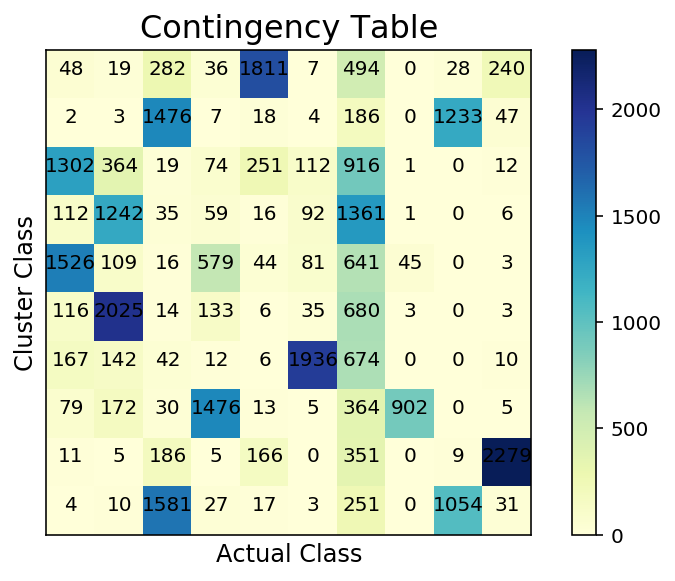

Report 5 Measures for K-Means Clustering
Homogeneity Score: 0.464233
Completeness Score: 0.482881
V-Measure Score: 0.473374
Adjusted Rand Index: 0.309225
Adjusted Mutual Information: 0.473059



n_components: 350
Show Contingency Matrix:


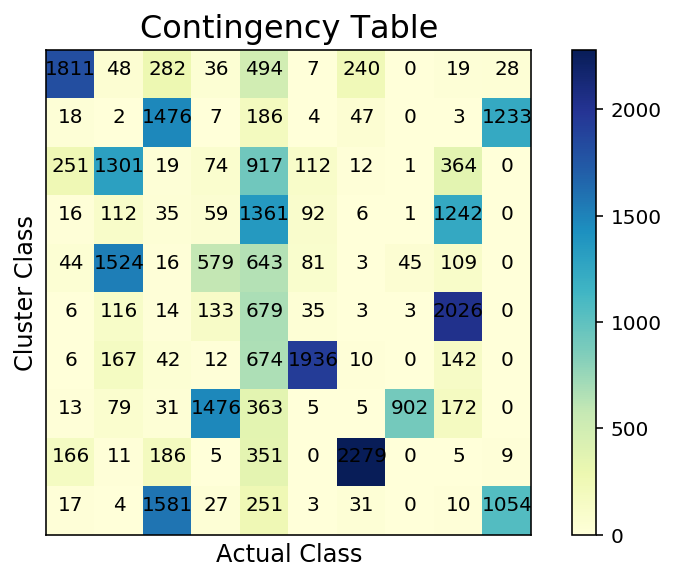

Report 5 Measures for K-Means Clustering
Homogeneity Score: 0.464171
Completeness Score: 0.482823
V-Measure Score: 0.473313
Adjusted Rand Index: 0.309180
Adjusted Mutual Information: 0.472998



n_components: 450
Show Contingency Matrix:


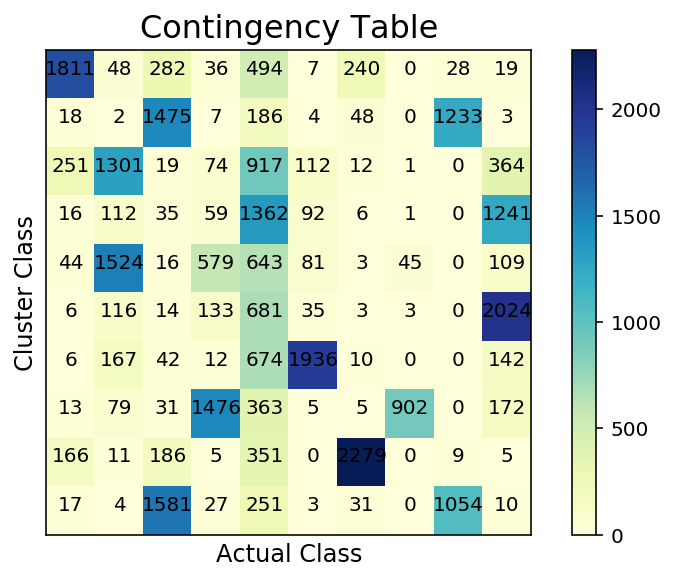

Report 5 Measures for K-Means Clustering
Homogeneity Score: 0.464080
Completeness Score: 0.482733
V-Measure Score: 0.473223
Adjusted Rand Index: 0.309066
Adjusted Mutual Information: 0.472907



n_components: 550
Show Contingency Matrix:


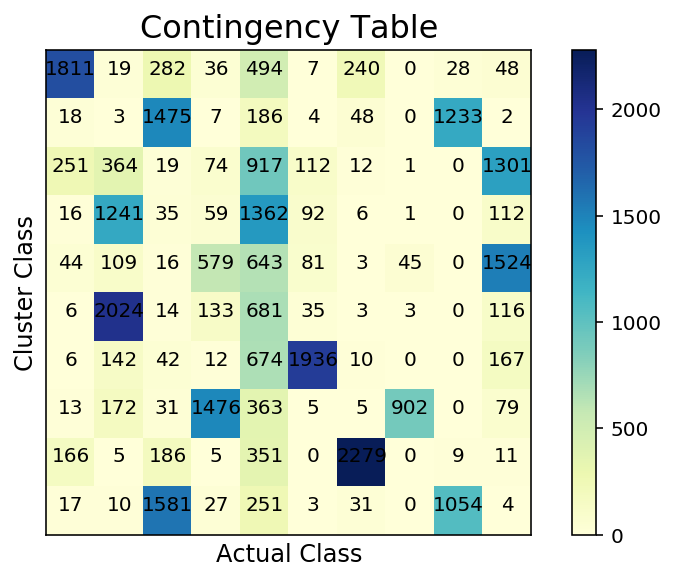

Report 5 Measures for K-Means Clustering
Homogeneity Score: 0.464080
Completeness Score: 0.482733
V-Measure Score: 0.473223
Adjusted Rand Index: 0.309066
Adjusted Mutual Information: 0.472907



n_components: 650
Show Contingency Matrix:


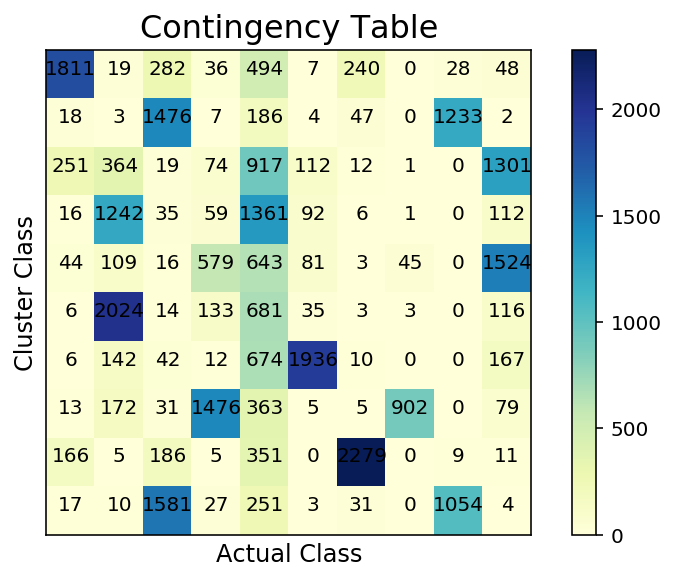

Report 5 Measures for K-Means Clustering
Homogeneity Score: 0.464129
Completeness Score: 0.482784
V-Measure Score: 0.473273
Adjusted Rand Index: 0.309100
Adjusted Mutual Information: 0.472957



n_components: 750
Show Contingency Matrix:


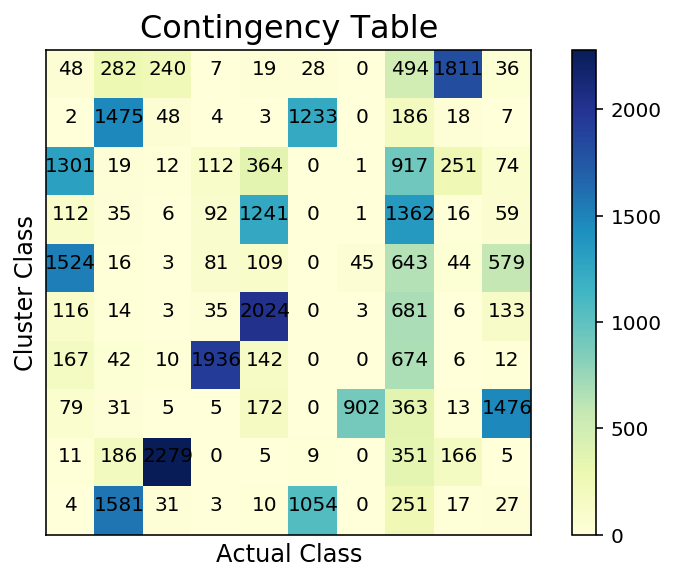

Report 5 Measures for K-Means Clustering
Homogeneity Score: 0.464080
Completeness Score: 0.482733
V-Measure Score: 0.473223
Adjusted Rand Index: 0.309066
Adjusted Mutual Information: 0.472907



n_components: 850
Show Contingency Matrix:


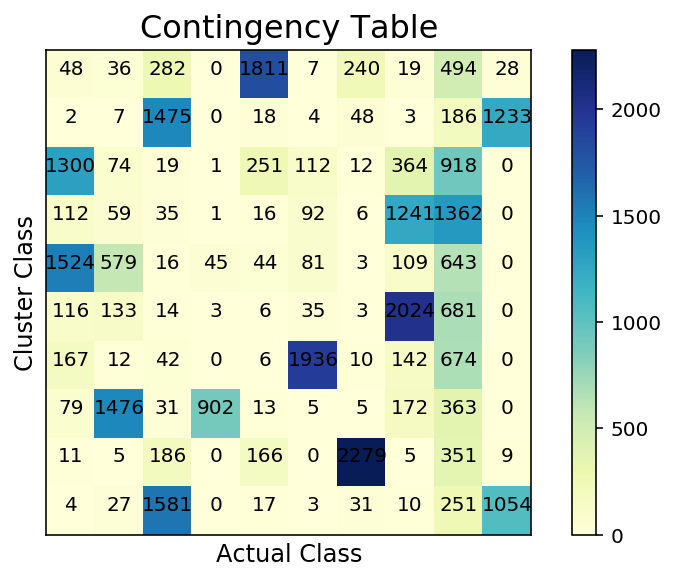

Report 5 Measures for K-Means Clustering
Homogeneity Score: 0.464067
Completeness Score: 0.482724
V-Measure Score: 0.473211
Adjusted Rand Index: 0.309044
Adjusted Mutual Information: 0.472896



n_components: 950
Show Contingency Matrix:


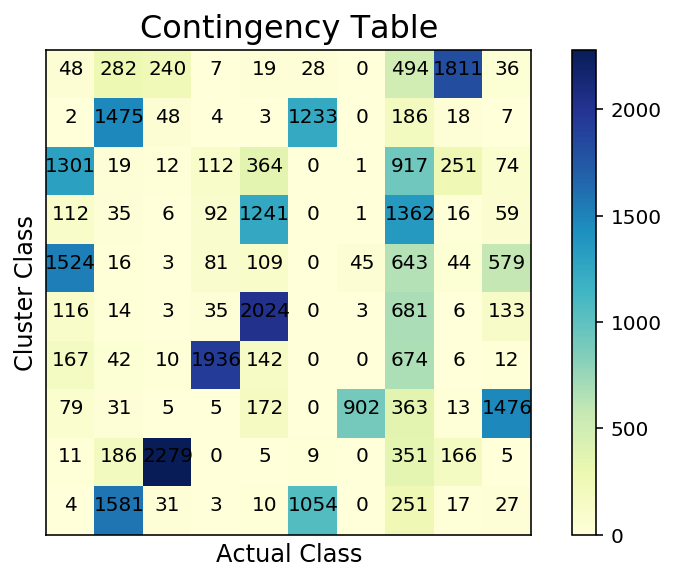

Report 5 Measures for K-Means Clustering
Homogeneity Score: 0.464080
Completeness Score: 0.482733
V-Measure Score: 0.473223
Adjusted Rand Index: 0.309066
Adjusted Mutual Information: 0.472907



n_components: 1050
Show Contingency Matrix:


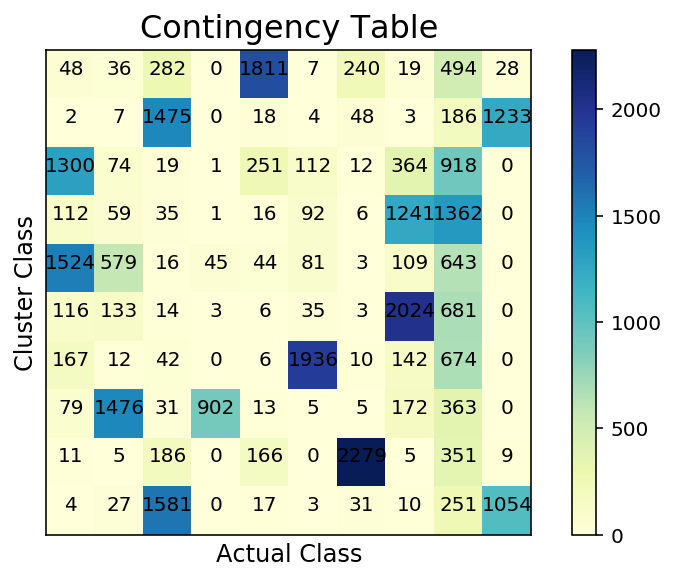

Report 5 Measures for K-Means Clustering
Homogeneity Score: 0.464067
Completeness Score: 0.482724
V-Measure Score: 0.473211
Adjusted Rand Index: 0.309044
Adjusted Mutual Information: 0.472896



n_components: 1150
Show Contingency Matrix:


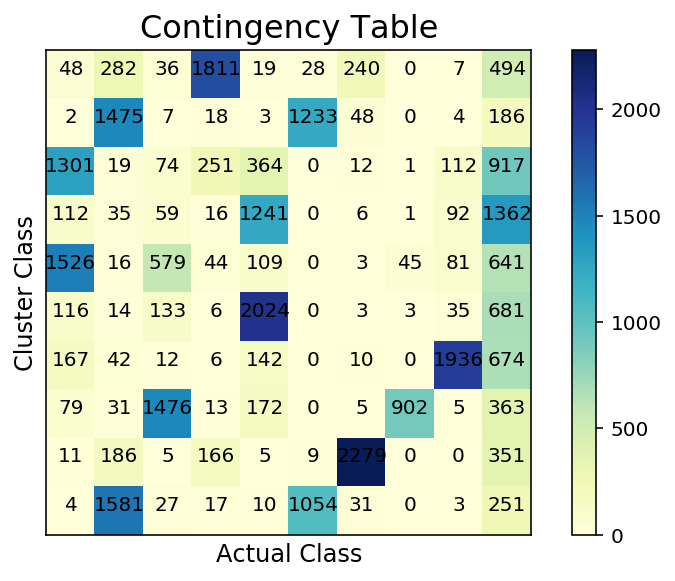

Report 5 Measures for K-Means Clustering
Homogeneity Score: 0.464121
Completeness Score: 0.482768
V-Measure Score: 0.473261
Adjusted Rand Index: 0.309133
Adjusted Mutual Information: 0.472946



n_components: 1250
Show Contingency Matrix:


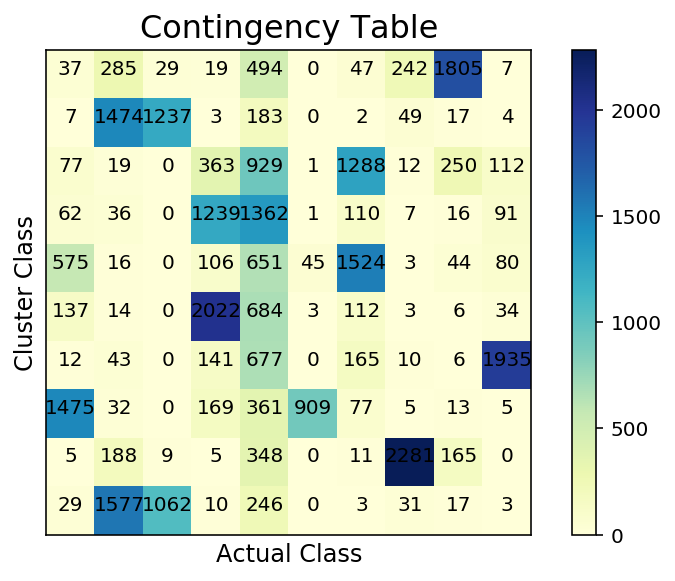

Report 5 Measures for K-Means Clustering
Homogeneity Score: 0.464154
Completeness Score: 0.482756
V-Measure Score: 0.473272
Adjusted Rand Index: 0.308922
Adjusted Mutual Information: 0.472957



n_components: 1350
Show Contingency Matrix:


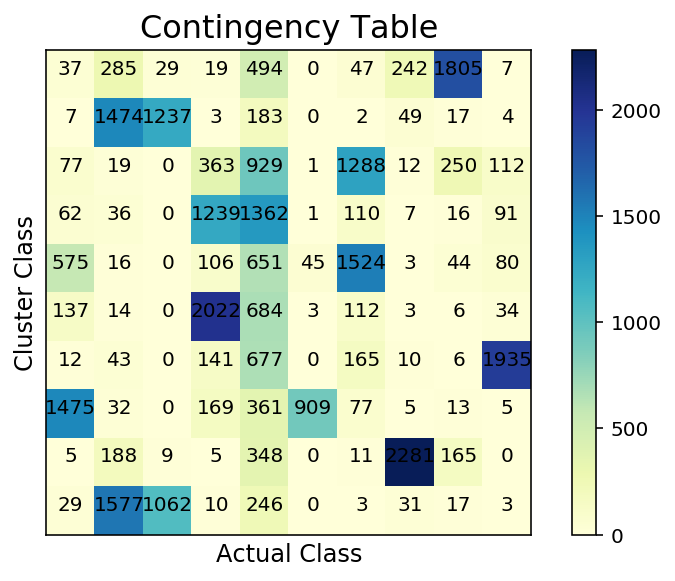

Report 5 Measures for K-Means Clustering
Homogeneity Score: 0.464154
Completeness Score: 0.482756
V-Measure Score: 0.473272
Adjusted Rand Index: 0.308922
Adjusted Mutual Information: 0.472957



n_components: 1450
Show Contingency Matrix:


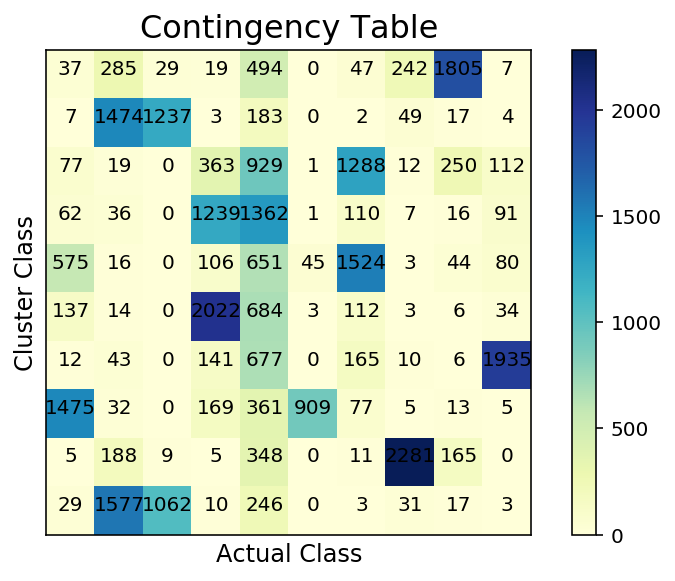

Report 5 Measures for K-Means Clustering
Homogeneity Score: 0.464154
Completeness Score: 0.482756
V-Measure Score: 0.473272
Adjusted Rand Index: 0.308922
Adjusted Mutual Information: 0.472957



n_components: 1550
Show Contingency Matrix:


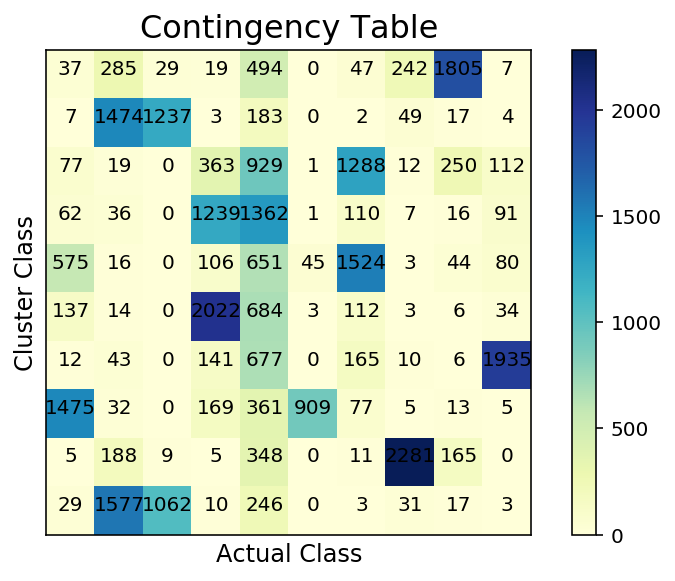

Report 5 Measures for K-Means Clustering
Homogeneity Score: 0.464154
Completeness Score: 0.482756
V-Measure Score: 0.473272
Adjusted Rand Index: 0.308922
Adjusted Mutual Information: 0.472957



n_components: 1650
Show Contingency Matrix:


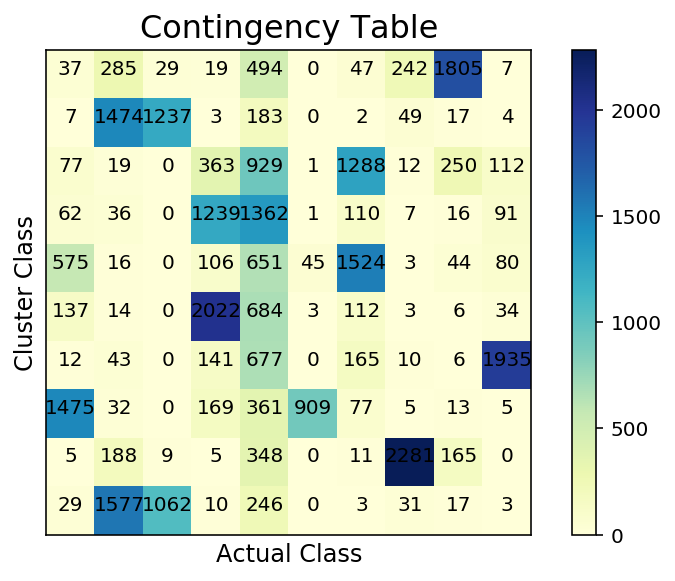

Report 5 Measures for K-Means Clustering
Homogeneity Score: 0.464154
Completeness Score: 0.482756
V-Measure Score: 0.473272
Adjusted Rand Index: 0.308922
Adjusted Mutual Information: 0.472957



n_components: 1750
Show Contingency Matrix:


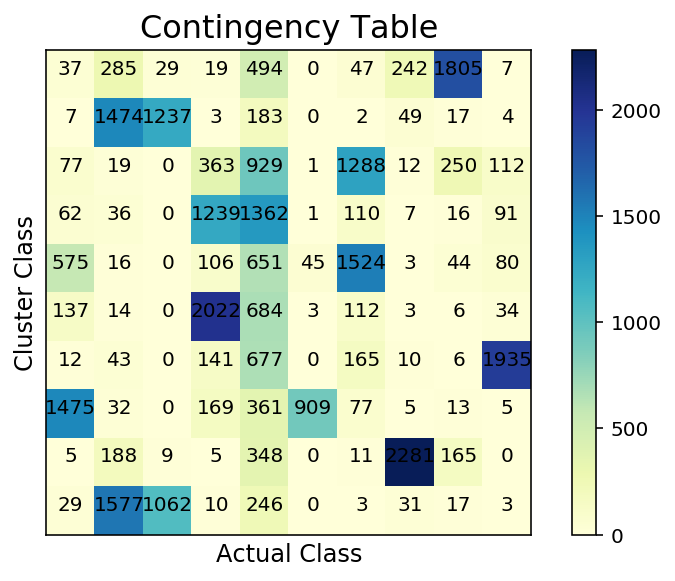

Report 5 Measures for K-Means Clustering
Homogeneity Score: 0.464154
Completeness Score: 0.482756
V-Measure Score: 0.473272
Adjusted Rand Index: 0.308922
Adjusted Mutual Information: 0.472957



n_components: 1850
Show Contingency Matrix:


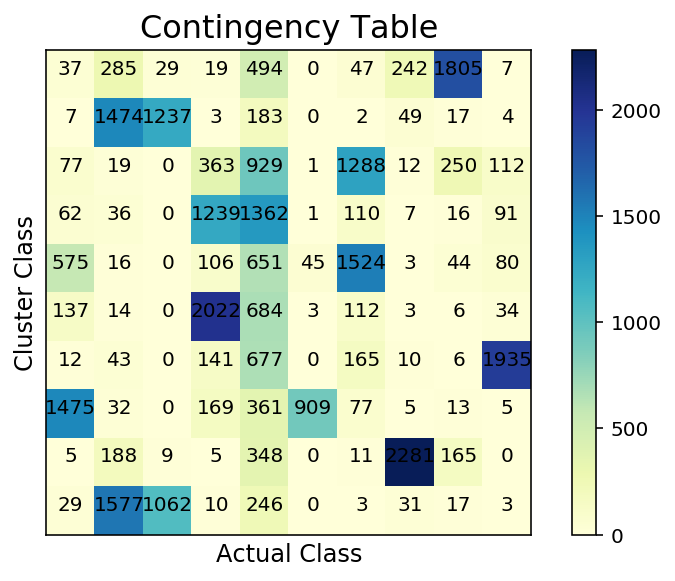

Report 5 Measures for K-Means Clustering
Homogeneity Score: 0.464154
Completeness Score: 0.482756
V-Measure Score: 0.473272
Adjusted Rand Index: 0.308922
Adjusted Mutual Information: 0.472957



n_components: 1950
Show Contingency Matrix:


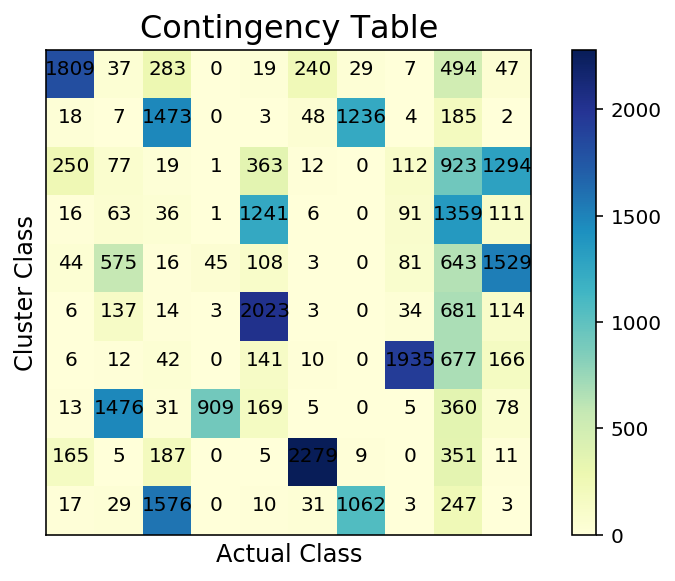

Report 5 Measures for K-Means Clustering
Homogeneity Score: 0.464275
Completeness Score: 0.482814
V-Measure Score: 0.473363
Adjusted Rand Index: 0.309213
Adjusted Mutual Information: 0.473048





In [11]:
#SVD analysis for different r
svd_homogeneity = []
svd_completeness = []
svd_v_measure = []
svd_adjusted_mutual_info = []
svd_adjusted_rand_index = []


for r in range(50,2050,100):
    print('n_components:',r)
    
    svd_dataset,svd = svd_dimension_reduction(features_kmeans, n_components = r)
    k_means_svd, km_svd = k_means_clustering(svd_dataset, labels_features, n_clusters=10,random_state=0, actual_class_names=[], cluster_class_names=[])
    svd_homogeneity.append(k_means_svd['homogeneity'])
    svd_completeness.append(k_means_svd['completeness'])
    svd_v_measure.append(k_means_svd['v_measure'])
    svd_adjusted_mutual_info.append(k_means_svd['adjusted_mutual_info'])
    svd_adjusted_rand_index.append(k_means_svd['adjusted_rand_index'])
    print('\n\n')

<Figure size 432x288 with 0 Axes>

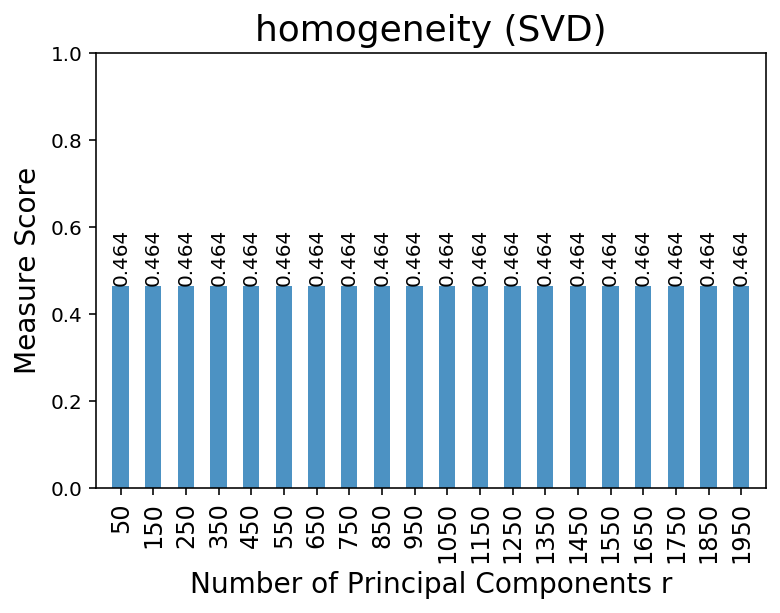

<Figure size 432x288 with 0 Axes>

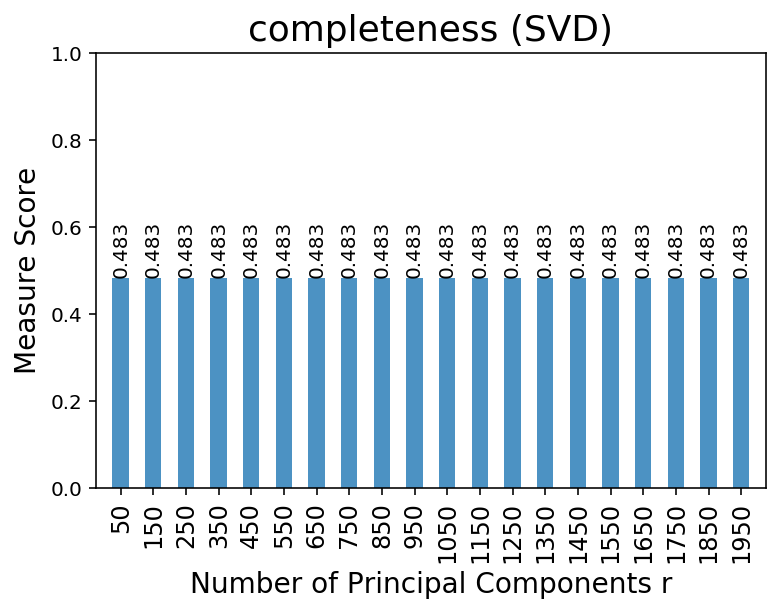

<Figure size 432x288 with 0 Axes>

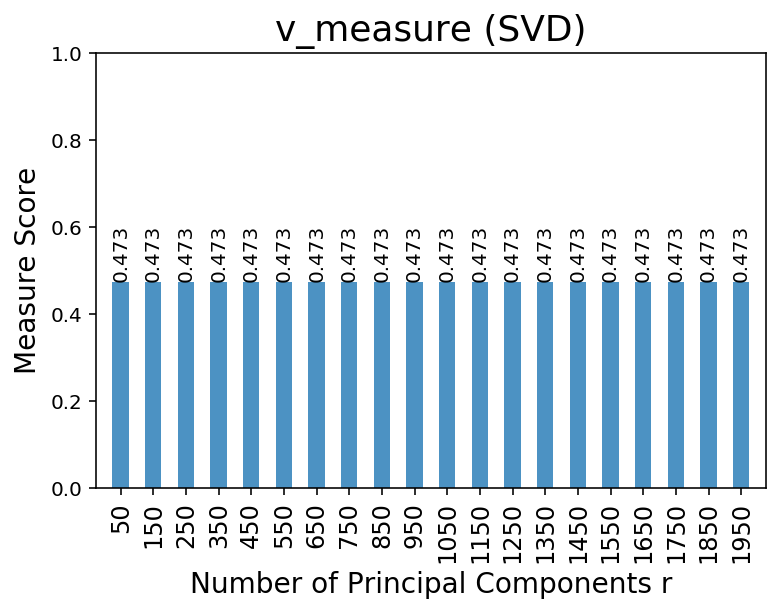

<Figure size 432x288 with 0 Axes>

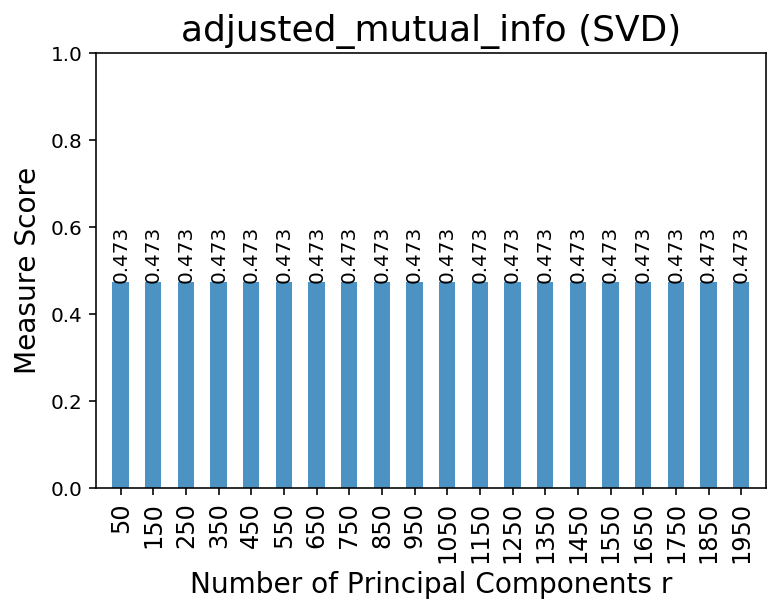

<Figure size 432x288 with 0 Axes>

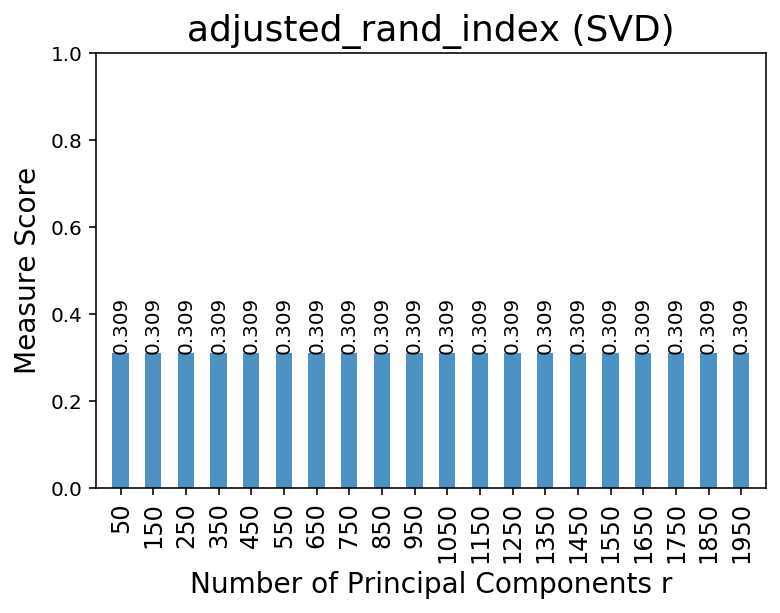

In [14]:
plot_scores('SVD', 'homogeneity',svd_homogeneity, x_labels=range(50,2050,100), height=range(1,len(svd_homogeneity)+1),xtickangle=90)
plot_scores('SVD', 'completeness',svd_completeness, x_labels=range(50,2050,100), height=range(1,len(svd_completeness)+1),xtickangle=90)
plot_scores('SVD', 'v_measure',svd_v_measure, x_labels=range(50,2050,100), height=range(1,len(svd_v_measure)+1),xtickangle=90)
plot_scores('SVD', 'adjusted_mutual_info',svd_adjusted_mutual_info, x_labels=range(50,2050,100), height=range(1,len(svd_adjusted_mutual_info)+1),xtickangle=90)
plot_scores('SVD', 'adjusted_rand_index',svd_adjusted_rand_index, x_labels=range(50,2050,100), height=range(1,len(svd_adjusted_rand_index)+1),xtickangle=90)

n_components: 1
Show Contingency Matrix:


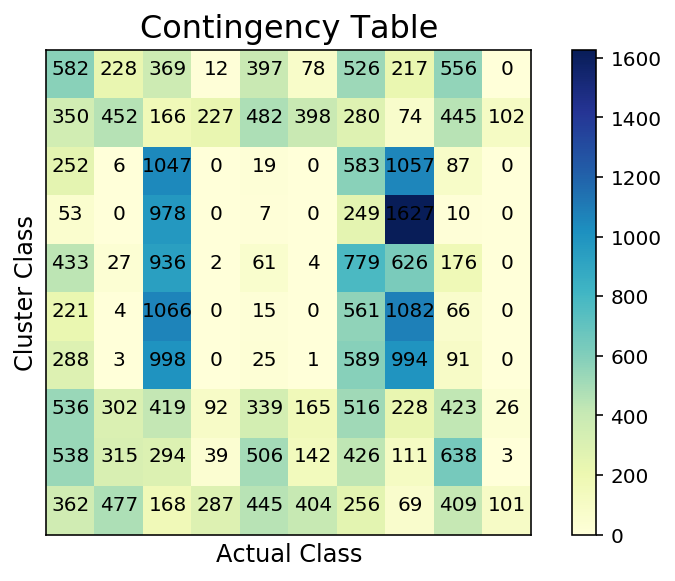

Report 5 Measures for K-Means Clustering
Homogeneity Score: 0.136815
Completeness Score: 0.154192
V-Measure Score: 0.144985
Adjusted Rand Index: 0.063036
Adjusted Mutual Information: 0.144452



n_components: 2
Show Contingency Matrix:


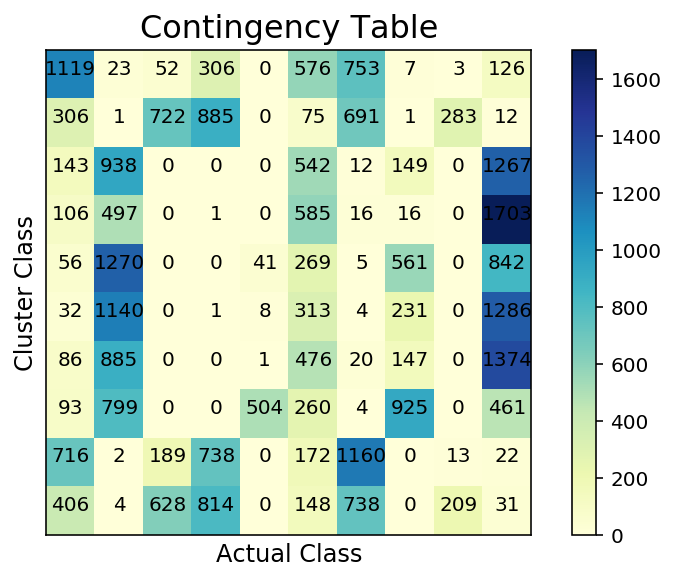

Report 5 Measures for K-Means Clustering
Homogeneity Score: 0.282078
Completeness Score: 0.312098
V-Measure Score: 0.296330
Adjusted Rand Index: 0.131475
Adjusted Mutual Information: 0.295895



n_components: 3
Show Contingency Matrix:


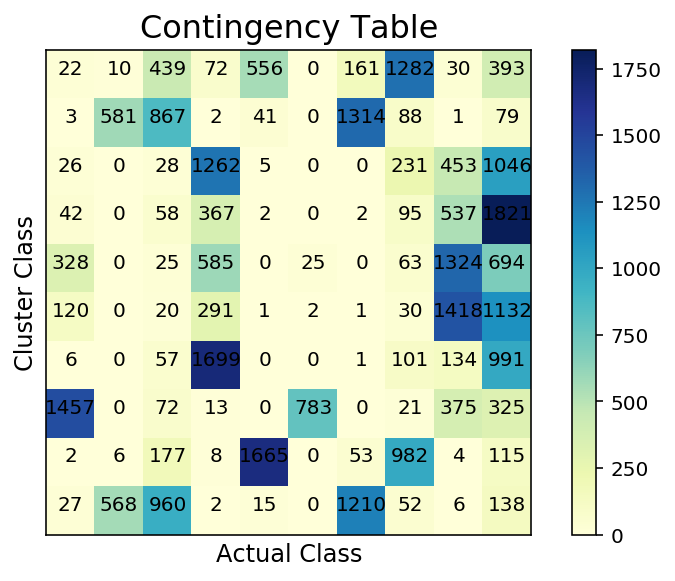

Report 5 Measures for K-Means Clustering
Homogeneity Score: 0.384213
Completeness Score: 0.410078
V-Measure Score: 0.396724
Adjusted Rand Index: 0.213716
Adjusted Mutual Information: 0.396358



n_components: 5
Show Contingency Matrix:


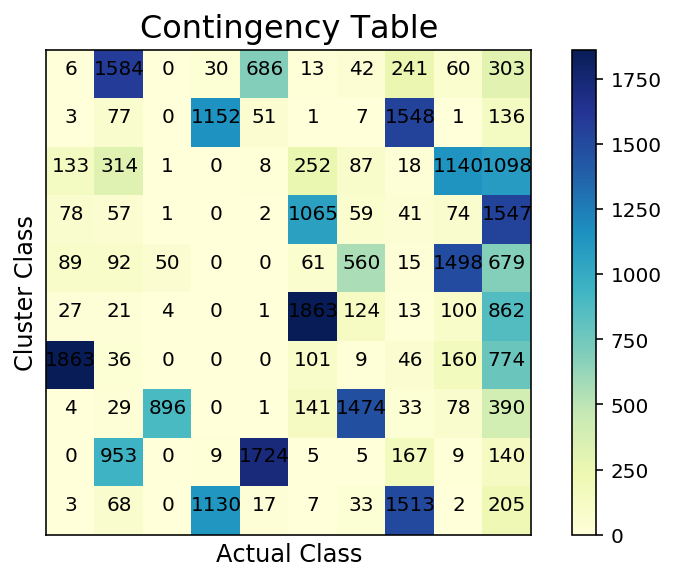

Report 5 Measures for K-Means Clustering
Homogeneity Score: 0.447456
Completeness Score: 0.465171
V-Measure Score: 0.456142
Adjusted Rand Index: 0.280297
Adjusted Mutual Information: 0.455816



n_components: 10
Show Contingency Matrix:


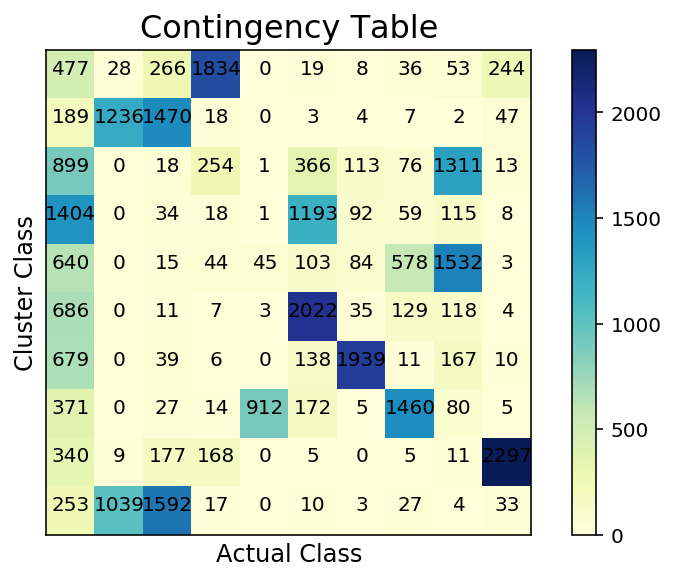

Report 5 Measures for K-Means Clustering
Homogeneity Score: 0.465293
Completeness Score: 0.483801
V-Measure Score: 0.474367
Adjusted Rand Index: 0.310968
Adjusted Mutual Information: 0.474052



n_components: 15
Show Contingency Matrix:


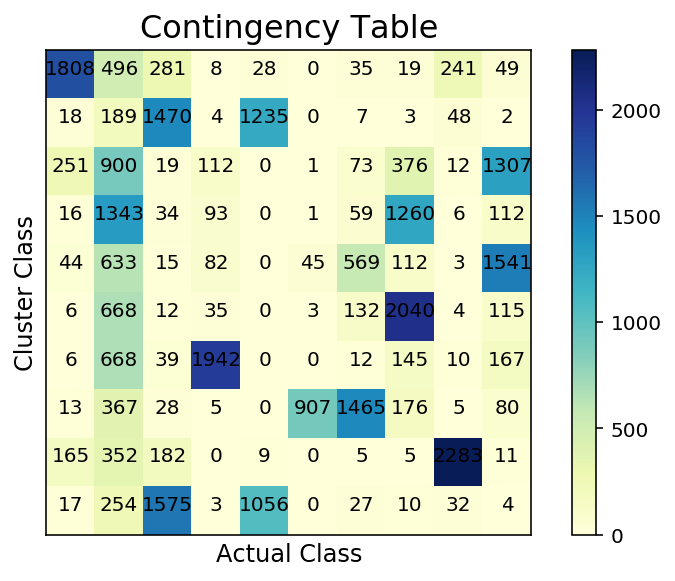

Report 5 Measures for K-Means Clustering
Homogeneity Score: 0.464676
Completeness Score: 0.483185
V-Measure Score: 0.473750
Adjusted Rand Index: 0.310133
Adjusted Mutual Information: 0.473435



n_components: 20
Show Contingency Matrix:


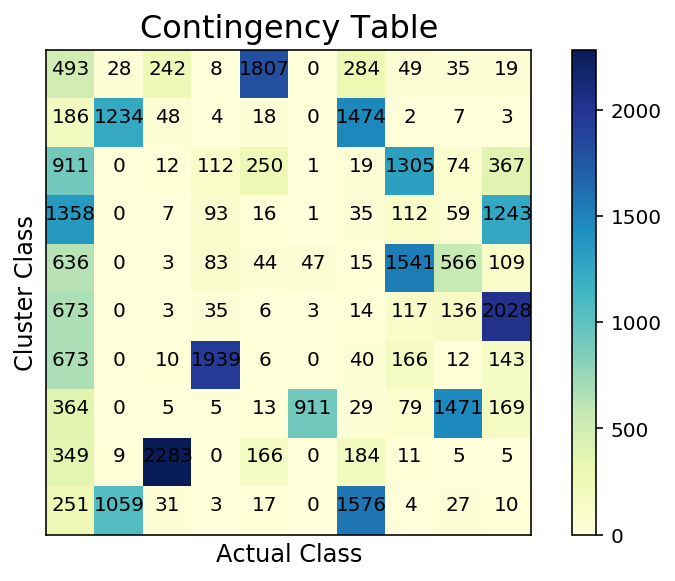

Report 5 Measures for K-Means Clustering
Homogeneity Score: 0.464670
Completeness Score: 0.483140
V-Measure Score: 0.473725
Adjusted Rand Index: 0.309992
Adjusted Mutual Information: 0.473410



n_components: 30
Show Contingency Matrix:


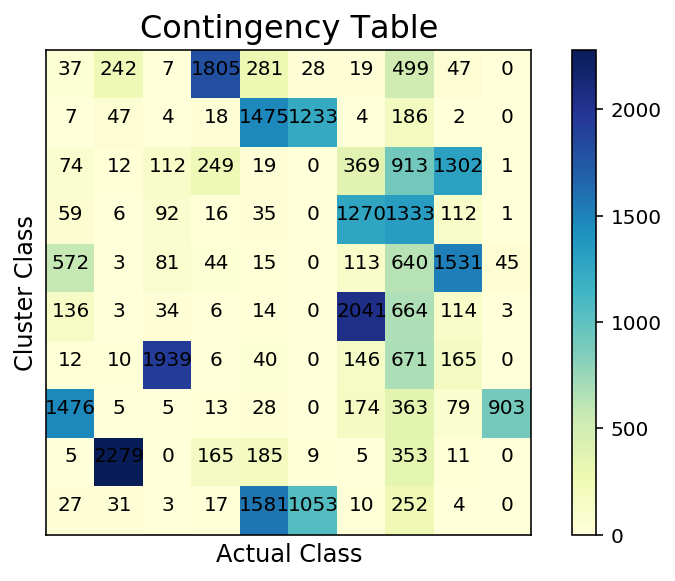

Report 5 Measures for K-Means Clustering
Homogeneity Score: 0.464571
Completeness Score: 0.483151
V-Measure Score: 0.473679
Adjusted Rand Index: 0.309905
Adjusted Mutual Information: 0.473364



n_components: 40
Show Contingency Matrix:


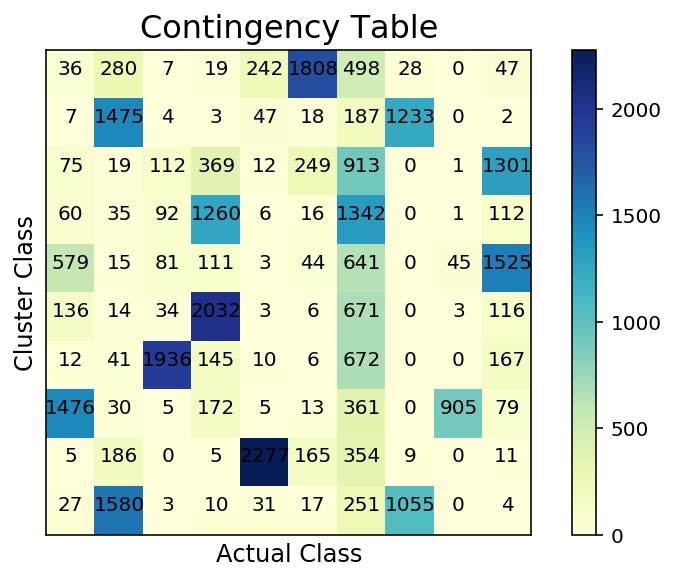

Report 5 Measures for K-Means Clustering
Homogeneity Score: 0.464262
Completeness Score: 0.482820
V-Measure Score: 0.473359
Adjusted Rand Index: 0.309335
Adjusted Mutual Information: 0.473044





In [15]:
#SVD analysis for smaller r
svd_homogeneity_s = []
svd_completeness_s = []
svd_v_measure_s = []
svd_adjusted_mutual_info_s = []
svd_adjusted_rand_index_s = []

r_small = [1,2,3,5,10,15,20,30,40]
for r in r_small:
    print('n_components:',r)
    
    svd_dataset,svd = svd_dimension_reduction(features_kmeans, n_components = r)
    k_means_svd, km_svd = k_means_clustering(svd_dataset, labels_features, n_clusters=10,random_state=0, actual_class_names=[], cluster_class_names=[])
    svd_homogeneity_s.append(k_means_svd['homogeneity'])
    svd_completeness_s.append(k_means_svd['completeness'])
    svd_v_measure_s.append(k_means_svd['v_measure'])
    svd_adjusted_mutual_info_s.append(k_means_svd['adjusted_mutual_info'])
    svd_adjusted_rand_index_s.append(k_means_svd['adjusted_rand_index'])
    print('\n\n')

<Figure size 432x288 with 0 Axes>

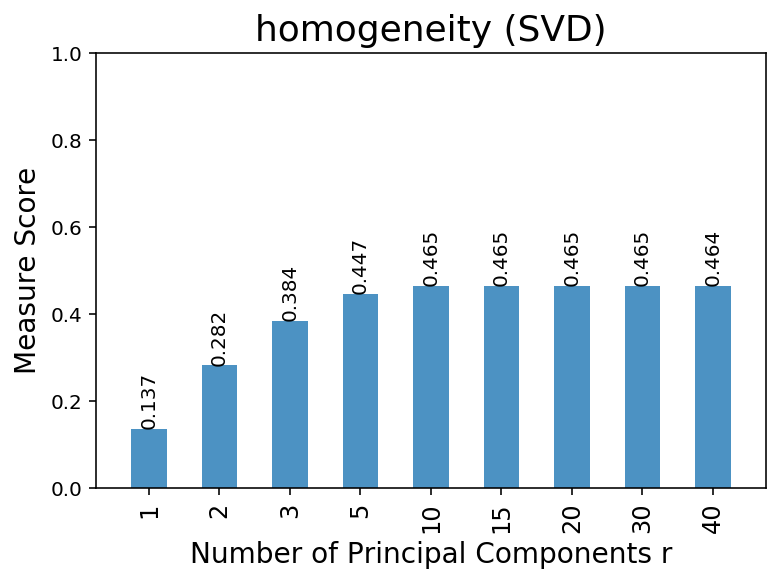

<Figure size 432x288 with 0 Axes>

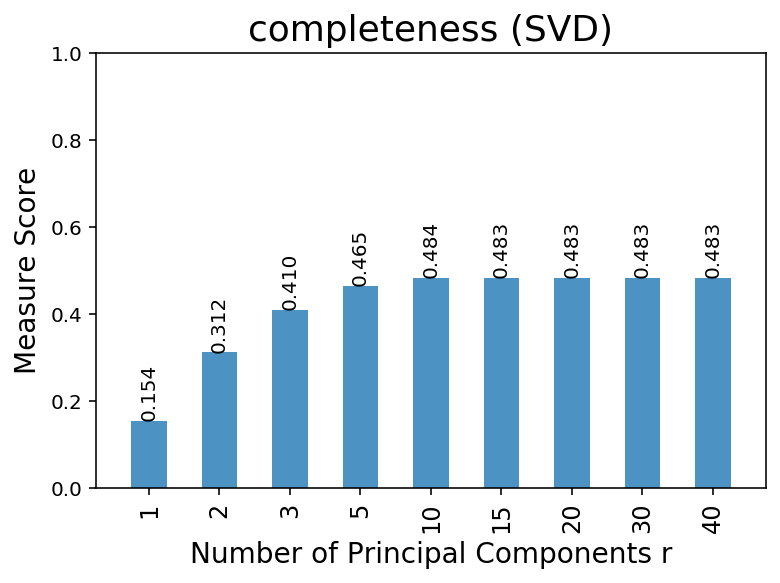

<Figure size 432x288 with 0 Axes>

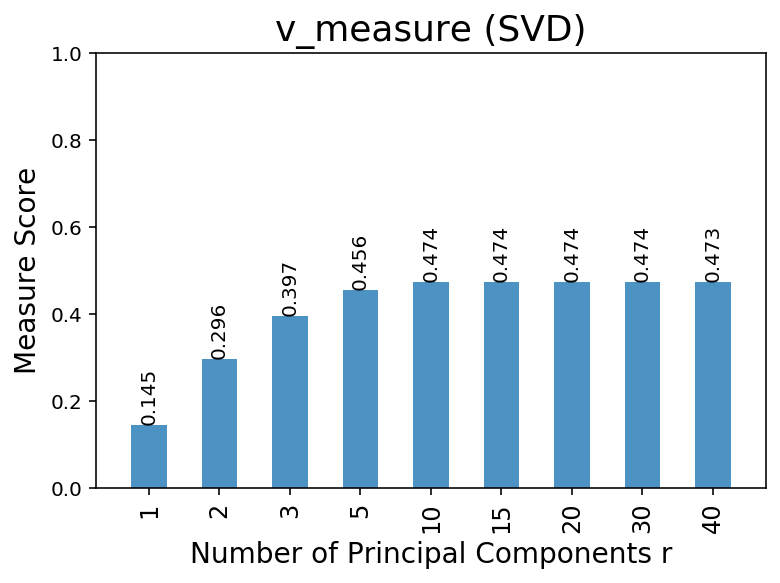

<Figure size 432x288 with 0 Axes>

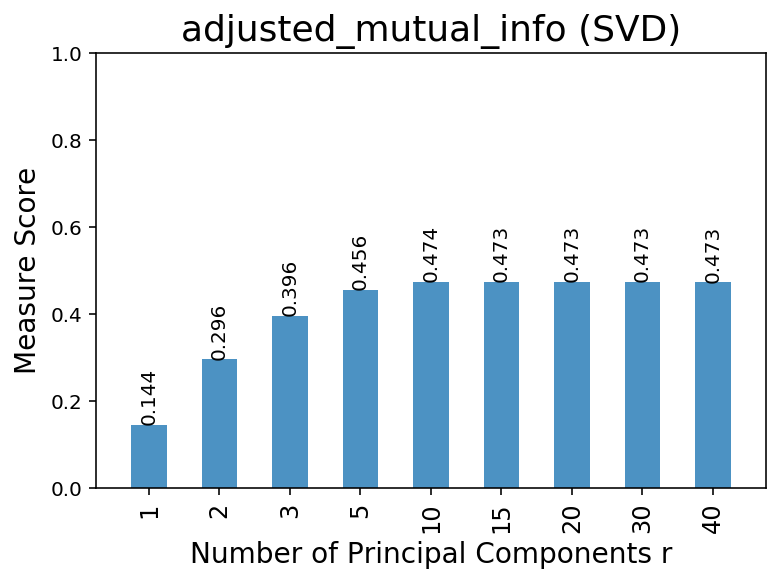

<Figure size 432x288 with 0 Axes>

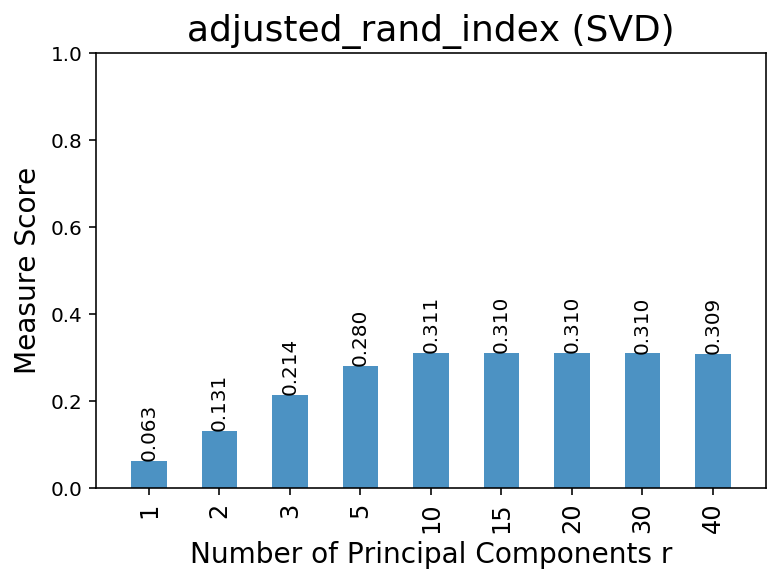

In [16]:
plot_scores('SVD', 'homogeneity',svd_homogeneity_s, x_labels=r_small, height=range(1,len(svd_homogeneity_s)+1),xtickangle=90)
plot_scores('SVD', 'completeness',svd_completeness_s, x_labels=r_small, height=range(1,len(svd_completeness_s)+1),xtickangle=90)
plot_scores('SVD', 'v_measure',svd_v_measure_s, x_labels=r_small, height=range(1,len(svd_v_measure_s)+1),xtickangle=90)
plot_scores('SVD', 'adjusted_mutual_info',svd_adjusted_mutual_info_s, x_labels=r_small, height=range(1,len(svd_adjusted_mutual_info_s)+1),xtickangle=90)
plot_scores('SVD', 'adjusted_rand_index',svd_adjusted_rand_index_s, x_labels=r_small, height=range(1,len(svd_adjusted_rand_index_s)+1),xtickangle=90)

n_components: 1
Show Contingency Matrix:


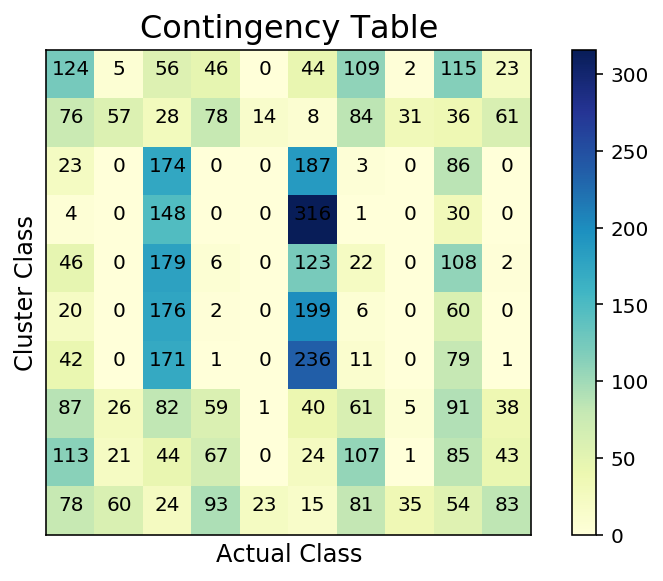

Report 5 Measures for K-Means Clustering
Homogeneity Score: 0.156082
Completeness Score: 0.180383
V-Measure Score: 0.167355
Adjusted Rand Index: 0.074329
Adjusted Mutual Information: 0.164151



n_components: 2
Show Contingency Matrix:


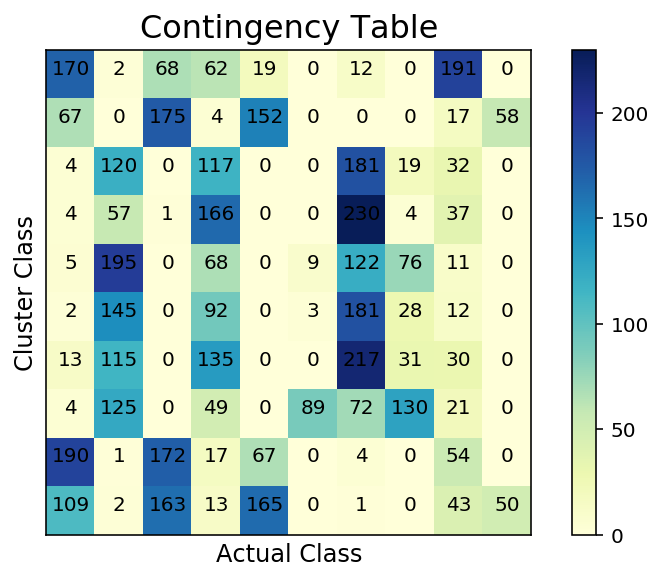

Report 5 Measures for K-Means Clustering
Homogeneity Score: 0.292698
Completeness Score: 0.315832
V-Measure Score: 0.303825
Adjusted Rand Index: 0.137337
Adjusted Mutual Information: 0.301253



n_components: 3
Show Contingency Matrix:


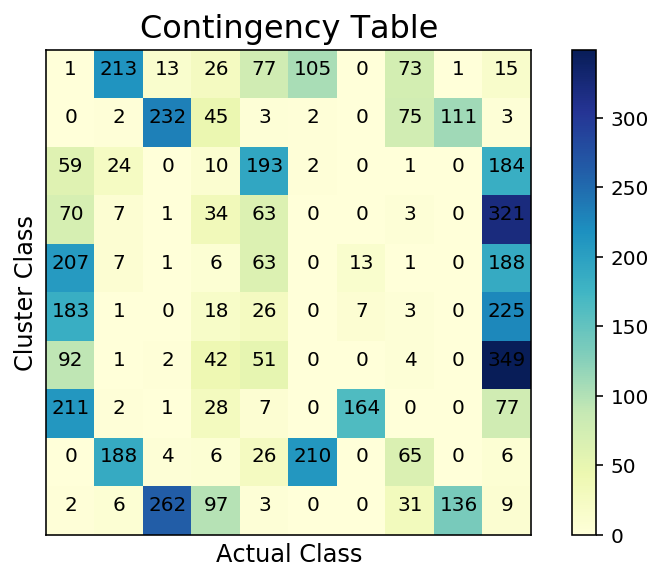

Report 5 Measures for K-Means Clustering
Homogeneity Score: 0.366970
Completeness Score: 0.400483
V-Measure Score: 0.382995
Adjusted Rand Index: 0.192044
Adjusted Mutual Information: 0.380706



n_components: 5
Show Contingency Matrix:


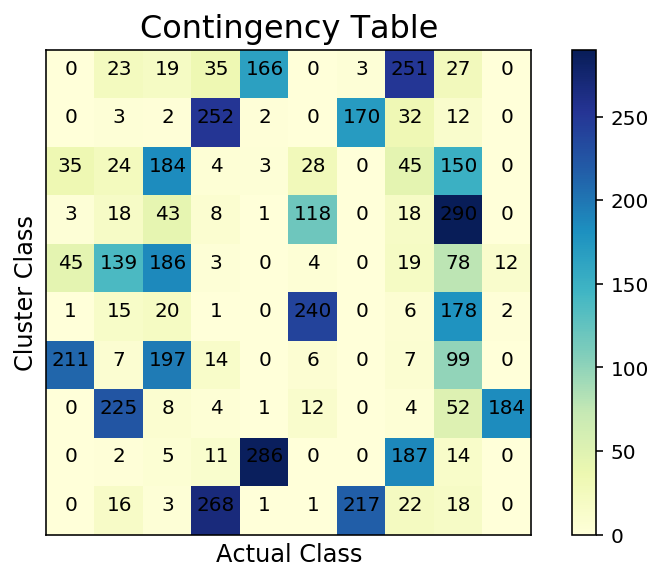

Report 5 Measures for K-Means Clustering
Homogeneity Score: 0.433432
Completeness Score: 0.447715
V-Measure Score: 0.440458
Adjusted Rand Index: 0.261095
Adjusted Mutual Information: 0.438439



n_components: 10
Show Contingency Matrix:


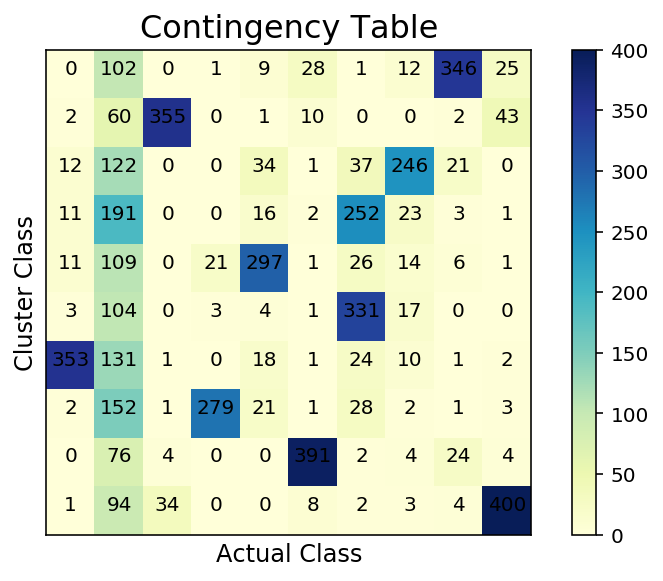

Report 5 Measures for K-Means Clustering
Homogeneity Score: 0.522830
Completeness Score: 0.544305
V-Measure Score: 0.533351
Adjusted Rand Index: 0.375147
Adjusted Mutual Information: 0.531662



n_components: 15
Show Contingency Matrix:


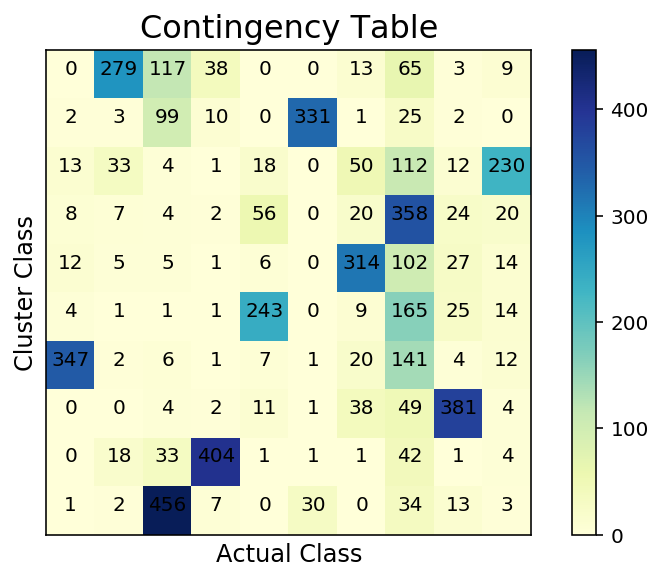

Report 5 Measures for K-Means Clustering
Homogeneity Score: 0.515170
Completeness Score: 0.535266
V-Measure Score: 0.525026
Adjusted Rand Index: 0.397644
Adjusted Mutual Information: 0.523308



n_components: 20
Show Contingency Matrix:


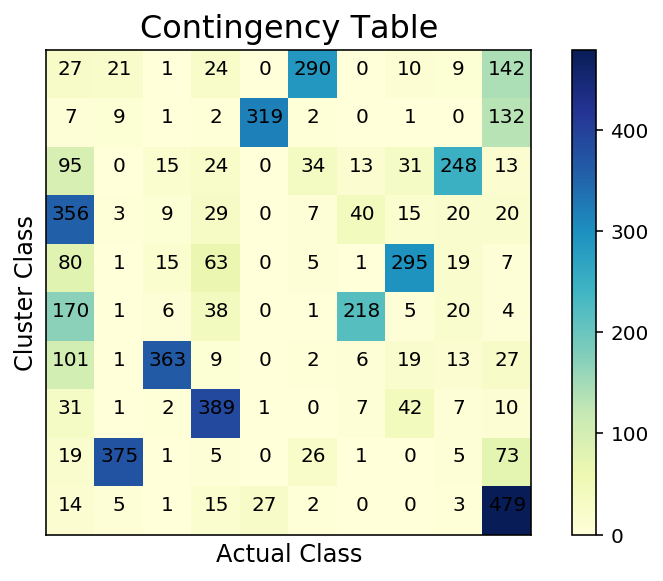

Report 5 Measures for K-Means Clustering
Homogeneity Score: 0.508588
Completeness Score: 0.527512
V-Measure Score: 0.517877
Adjusted Rand Index: 0.402254
Adjusted Mutual Information: 0.516135



n_components: 30
Show Contingency Matrix:


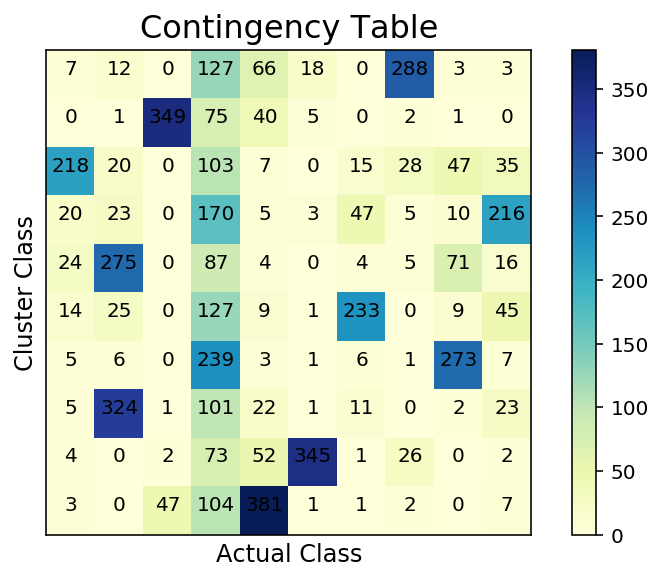

Report 5 Measures for K-Means Clustering
Homogeneity Score: 0.446645
Completeness Score: 0.469227
V-Measure Score: 0.457658
Adjusted Rand Index: 0.296253
Adjusted Mutual Information: 0.455685



n_components: 40
Show Contingency Matrix:


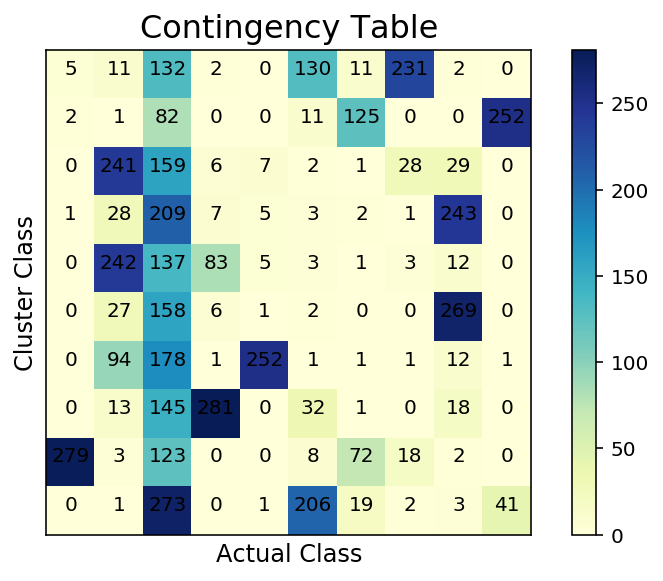

Report 5 Measures for K-Means Clustering
Homogeneity Score: 0.407527
Completeness Score: 0.451321
V-Measure Score: 0.428308
Adjusted Rand Index: 0.196711
Adjusted Mutual Information: 0.426173



n_components: 50
Show Contingency Matrix:


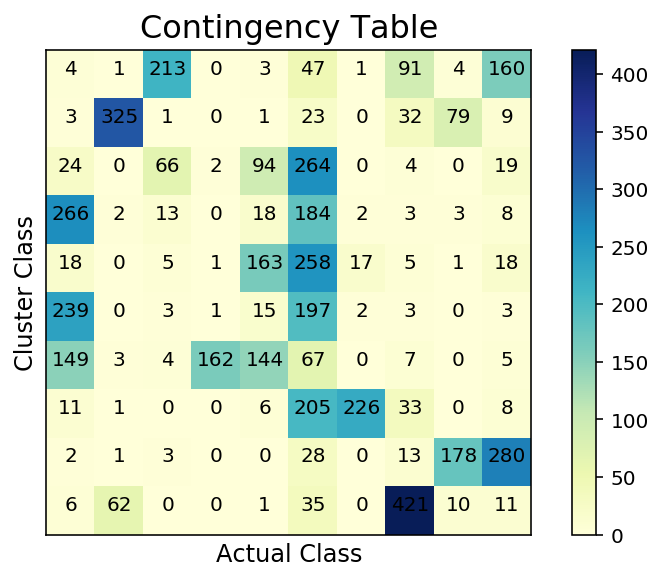

Report 5 Measures for K-Means Clustering
Homogeneity Score: 0.432245
Completeness Score: 0.466518
V-Measure Score: 0.448728
Adjusted Rand Index: 0.257819
Adjusted Mutual Information: 0.446694



n_components: 75
Show Contingency Matrix:


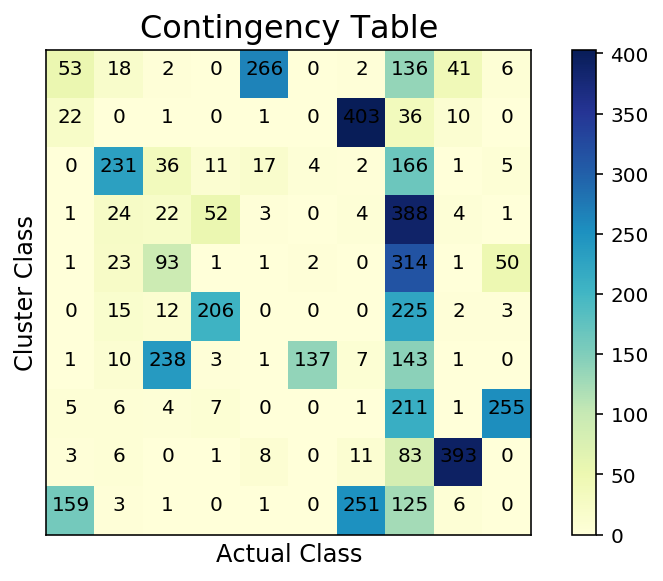

Report 5 Measures for K-Means Clustering
Homogeneity Score: 0.427391
Completeness Score: 0.491641
V-Measure Score: 0.457270
Adjusted Rand Index: 0.225633
Adjusted Mutual Information: 0.455205



n_components: 100
Show Contingency Matrix:


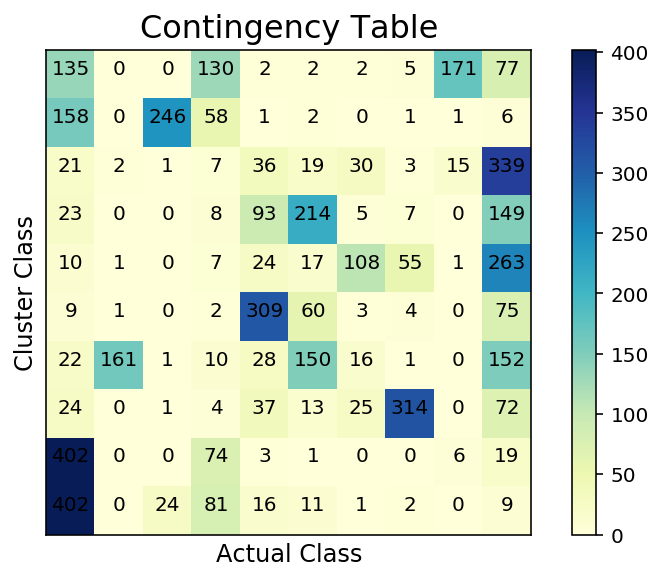

Report 5 Measures for K-Means Clustering
Homogeneity Score: 0.387824
Completeness Score: 0.431238
V-Measure Score: 0.408380
Adjusted Rand Index: 0.242870
Adjusted Mutual Information: 0.406165



n_components: 200
Show Contingency Matrix:


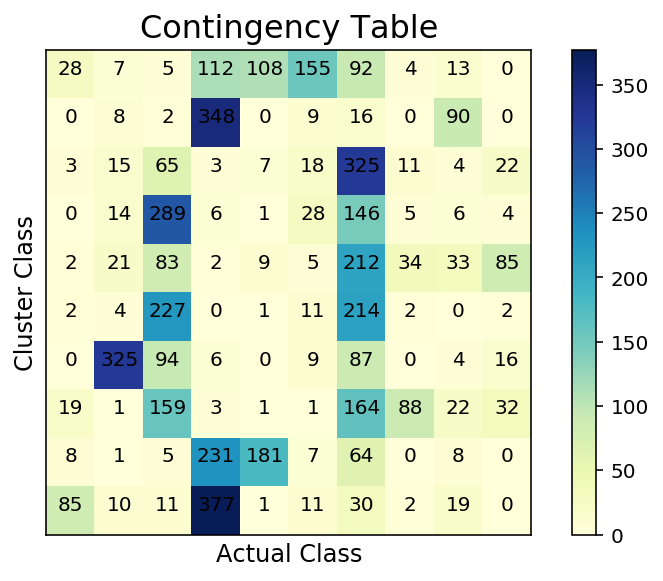

Report 5 Measures for K-Means Clustering
Homogeneity Score: 0.315608
Completeness Score: 0.368148
V-Measure Score: 0.339859
Adjusted Rand Index: 0.185350
Adjusted Mutual Information: 0.337328





In [10]:
# r = 10 is the best option with SVD
nmf_homogeneity = []
nmf_completeness = []
nmf_v_measure = []
nmf_adjusted_mutual_info = []
nmf_adjusted_rand_index = []

r_small2 = [1,2,3,5,10,15,20,30,40,50,75,100,200]
for r in r_small2:
    print('n_components:',r)
    nmf_dataset,nmf = nmf_dimension_reduction(features_kmeans[:5000], n_components = r)
    k_means_nmf, km_nmf = k_means_clustering(nmf_dataset, labels_features[:5000], n_clusters=10,random_state=0, actual_class_names=[], cluster_class_names=[])
    nmf_homogeneity.append(k_means_nmf['homogeneity'])
    nmf_completeness.append(k_means_nmf['completeness'])
    nmf_v_measure.append(k_means_nmf['v_measure'])
    nmf_adjusted_mutual_info.append(k_means_nmf['adjusted_mutual_info'])
    nmf_adjusted_rand_index.append(k_means_nmf['adjusted_rand_index'])
    print('\n\n')

<Figure size 432x288 with 0 Axes>

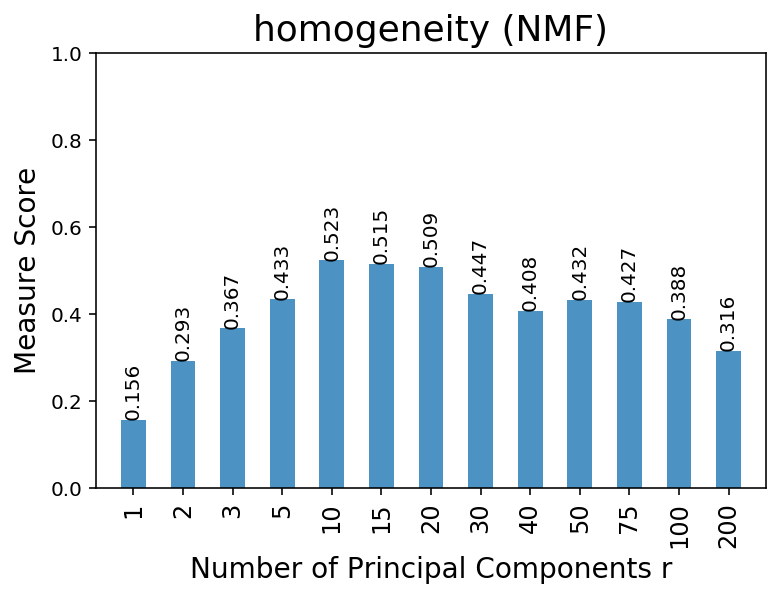

<Figure size 432x288 with 0 Axes>

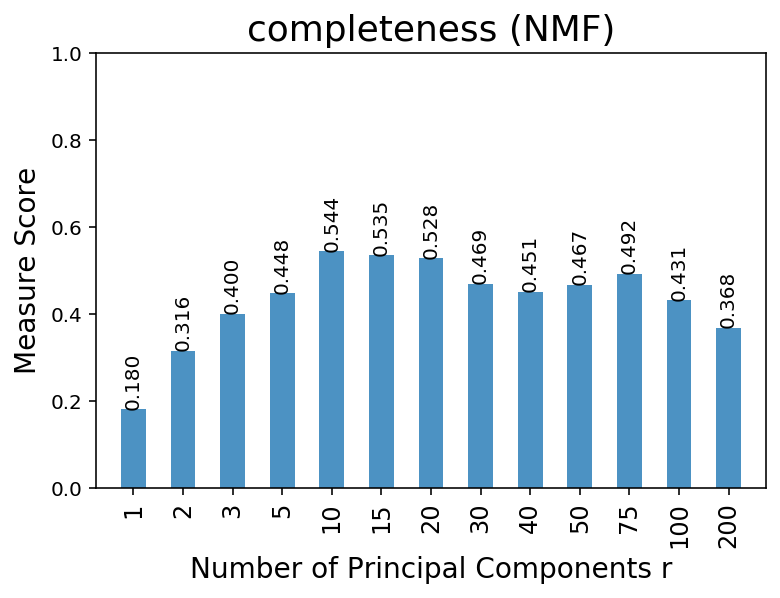

<Figure size 432x288 with 0 Axes>

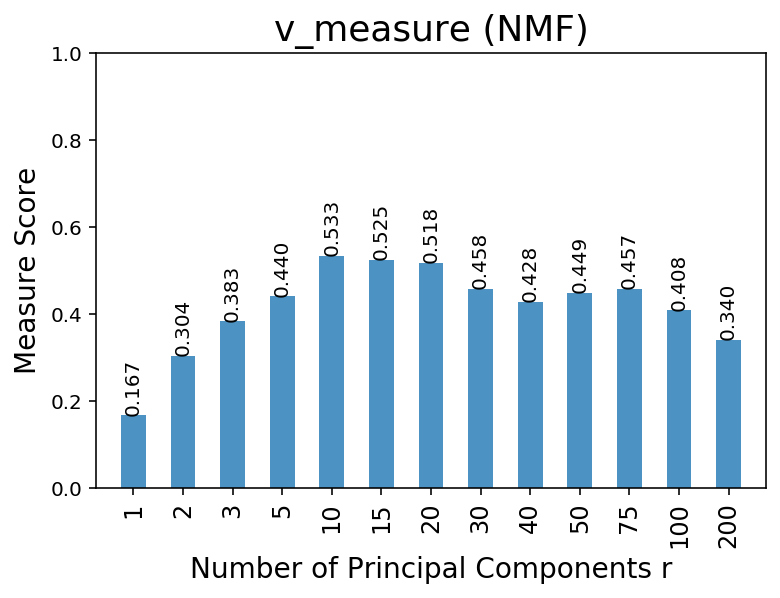

<Figure size 432x288 with 0 Axes>

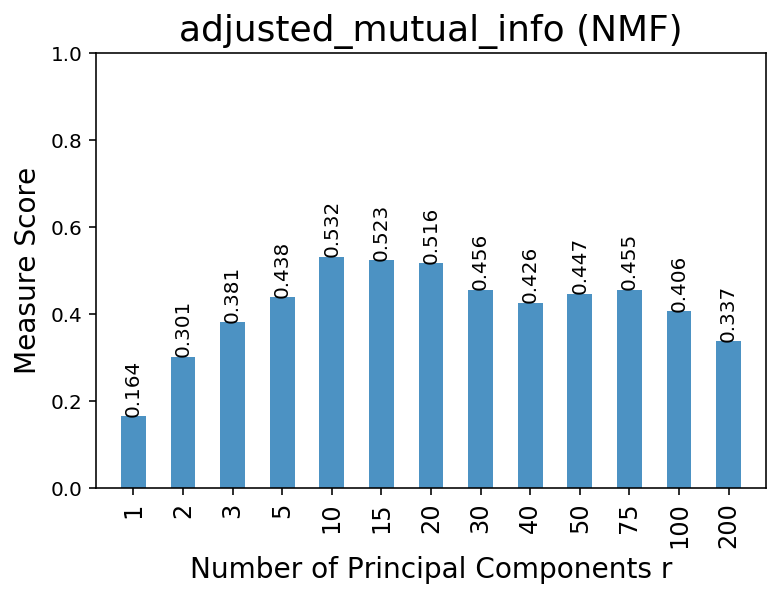

<Figure size 432x288 with 0 Axes>

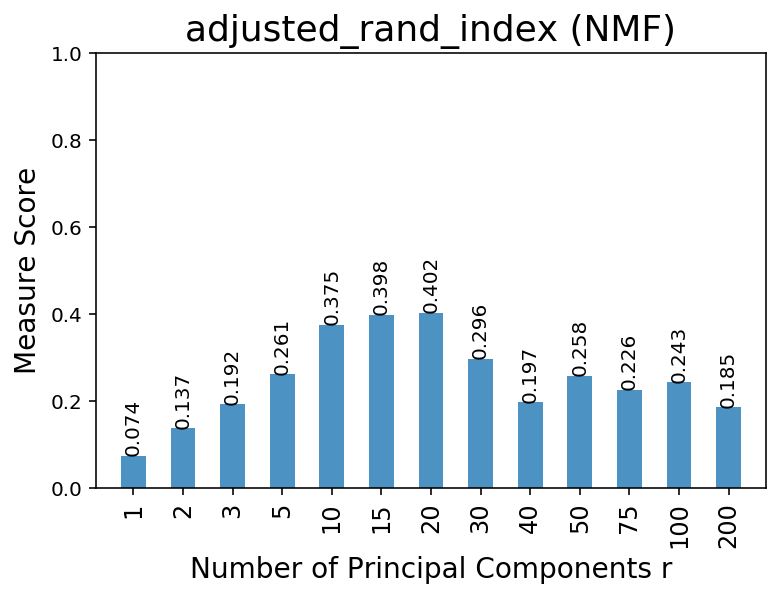

In [11]:
plot_scores('NMF', 'homogeneity',nmf_homogeneity, x_labels=r_small2,height=range(1,len(nmf_homogeneity)+1),xtickangle=90)
plot_scores('NMF', 'completeness',nmf_completeness, x_labels=r_small2,height=range(1,len(nmf_completeness)+1),xtickangle=90)
plot_scores('NMF', 'v_measure',nmf_v_measure, x_labels=r_small2,height=range(1,len(nmf_v_measure)+1),xtickangle=90)
plot_scores('NMF', 'adjusted_mutual_info',nmf_adjusted_mutual_info,x_labels=r_small2, height=range(1,len(nmf_adjusted_mutual_info)+1),xtickangle=90)
plot_scores('NMF', 'adjusted_rand_index',nmf_adjusted_rand_index,x_labels=r_small2, height=range(1,len(nmf_adjusted_rand_index)+1),xtickangle=90)

In [12]:
def nonlinear_transformation(data, C=0.01):
    return np.sign(data) * (np.log(np.abs(data) + C) - np.log(C))

def unit_variance_scale(data):
    return preprocessing.scale(data, with_mean=False, with_std=True)

In [15]:
C = 0.05

svd_best_r = 10
nmf_best_r = 10

svd_reduced, svd = svd_dimension_reduction(features_kmeans,svd_best_r)
nmf_reduced, temp = nmf_dimension_reduction(features_kmeans[:5000],nmf_best_r)

# Transformations on SVD reduced data
nonlinear_svd = nonlinear_transformation(svd_reduced)
scaled_svd = unit_variance_scale(svd_reduced)
nonlinear_scaled_svd = nonlinear_transformation(unit_variance_scale(svd_reduced))
scaled_nonlinear_svd = unit_variance_scale(nonlinear_transformation(svd_reduced))

# Transformations on NMF reduced data
nonlinear_nmf = nonlinear_transformation(nmf_reduced)
scaled_nmf = unit_variance_scale(nmf_reduced)
nonlinear_scaled_nmf = nonlinear_transformation(unit_variance_scale(nmf_reduced))
scaled_nonlinear_nmf = unit_variance_scale(nonlinear_transformation(nmf_reduced))


Results for Nonlinear SVD
Show Contingency Matrix:


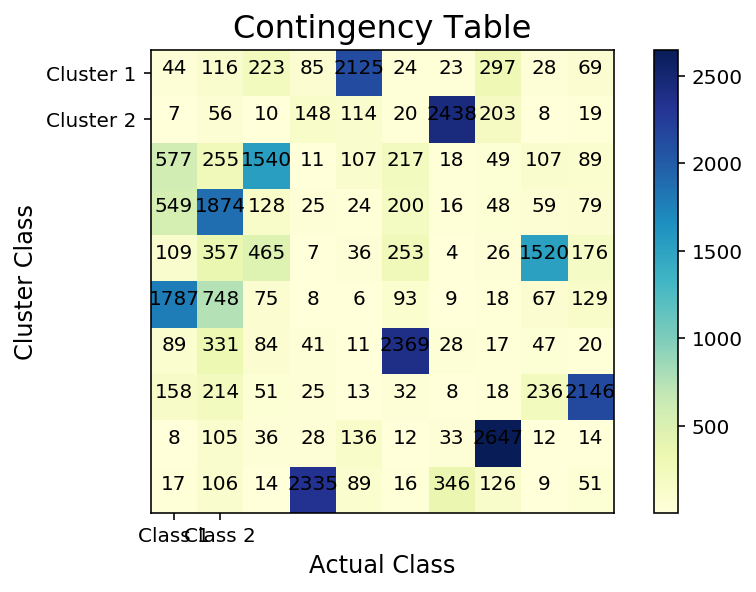

Report 5 Measures for K-Means Clustering
Homogeneity Score: 0.520786
Completeness Score: 0.524397
V-Measure Score: 0.522585
Adjusted Rand Index: 0.460062
Adjusted Mutual Information: 0.522304


<Figure size 432x288 with 0 Axes>

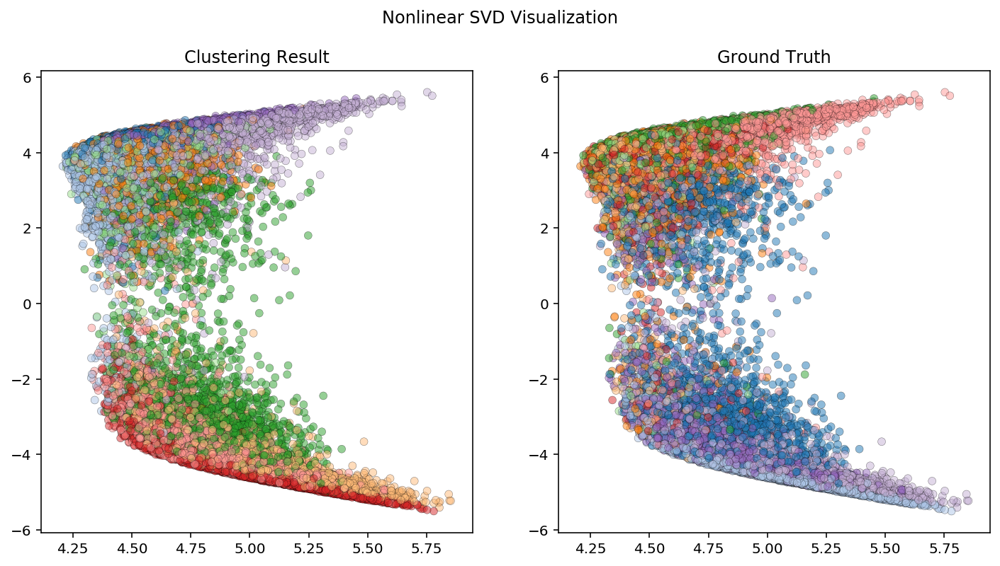


Results for Scaled SVD
Show Contingency Matrix:


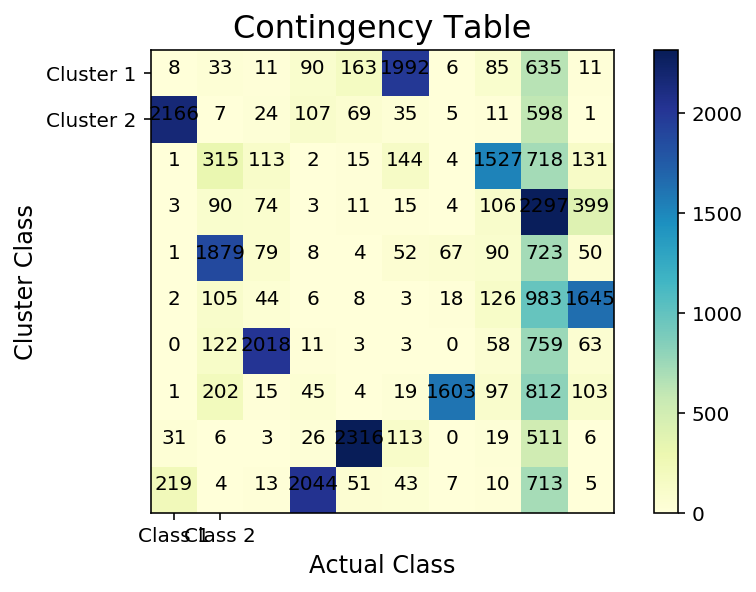

Report 5 Measures for K-Means Clustering
Homogeneity Score: 0.487396
Completeness Score: 0.520814
V-Measure Score: 0.503551
Adjusted Rand Index: 0.326027
Adjusted Mutual Information: 0.503250


<Figure size 432x288 with 0 Axes>

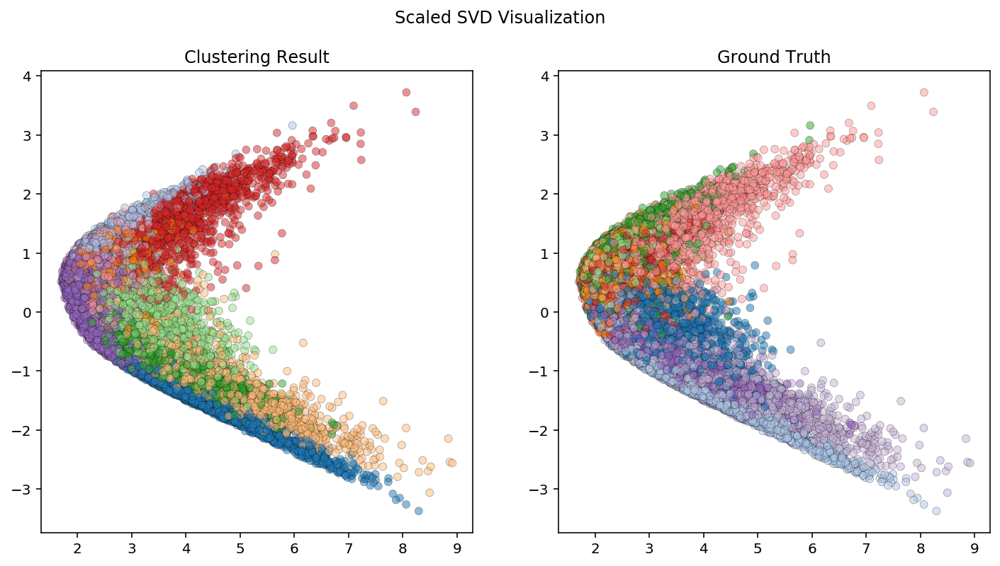


Results for Nonlinear of scaled SVD
Show Contingency Matrix:


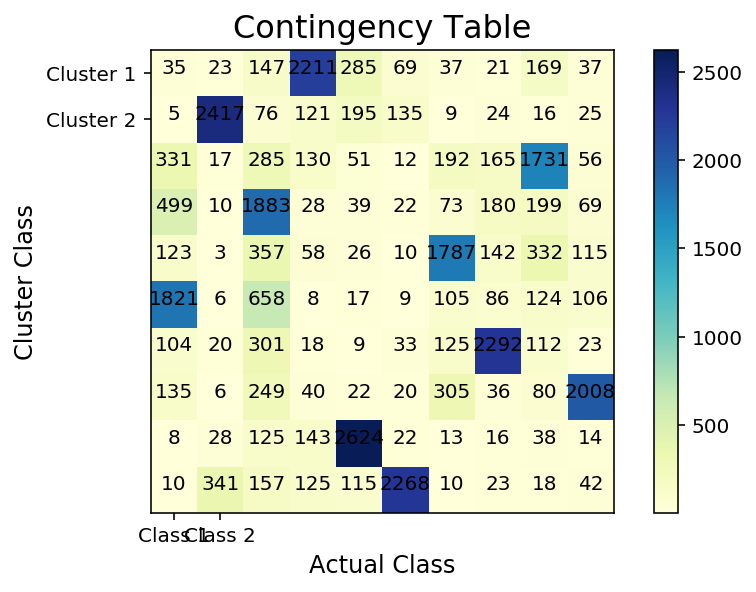

Report 5 Measures for K-Means Clustering
Homogeneity Score: 0.519336
Completeness Score: 0.521977
V-Measure Score: 0.520653
Adjusted Rand Index: 0.463587
Adjusted Mutual Information: 0.520371


<Figure size 432x288 with 0 Axes>

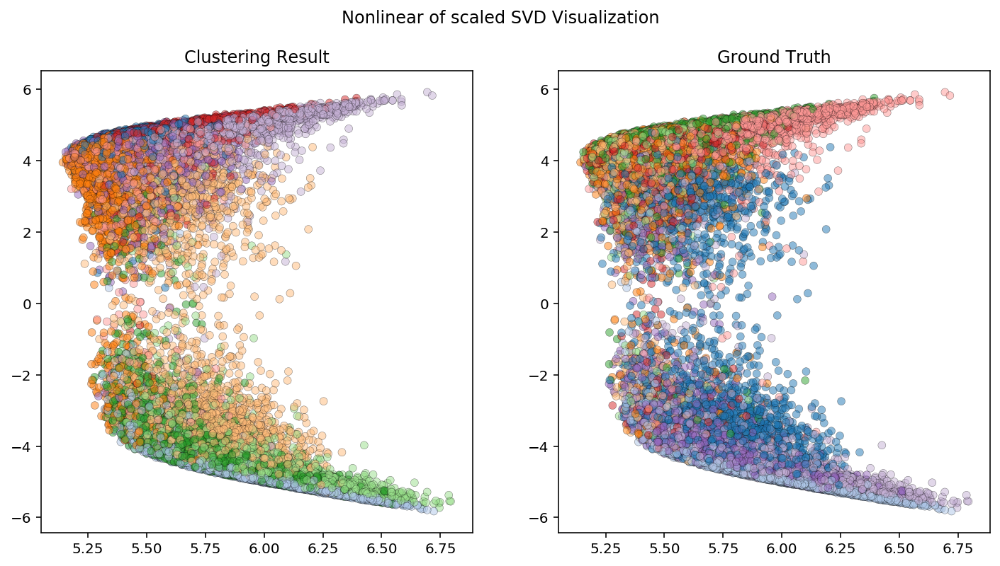


Results for Scaled nonlinear SVD
Show Contingency Matrix:


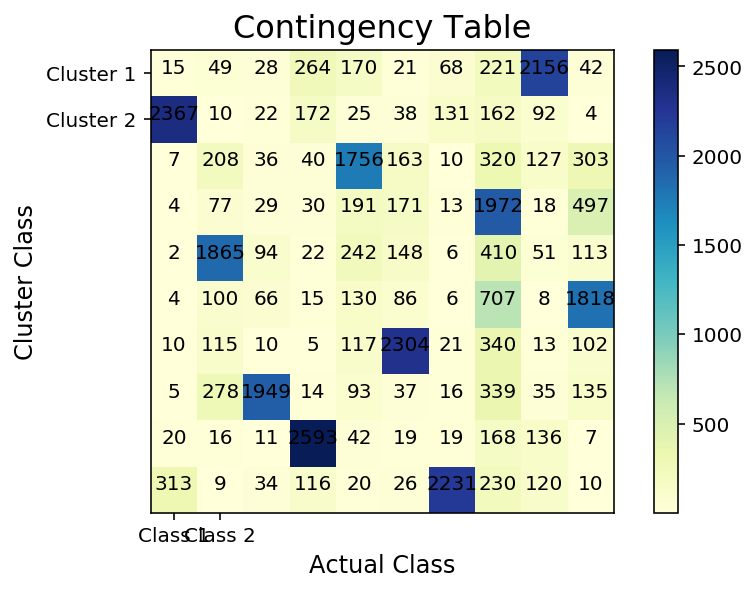

Report 5 Measures for K-Means Clustering
Homogeneity Score: 0.520228
Completeness Score: 0.525342
V-Measure Score: 0.522772
Adjusted Rand Index: 0.453989
Adjusted Mutual Information: 0.522491


<Figure size 432x288 with 0 Axes>

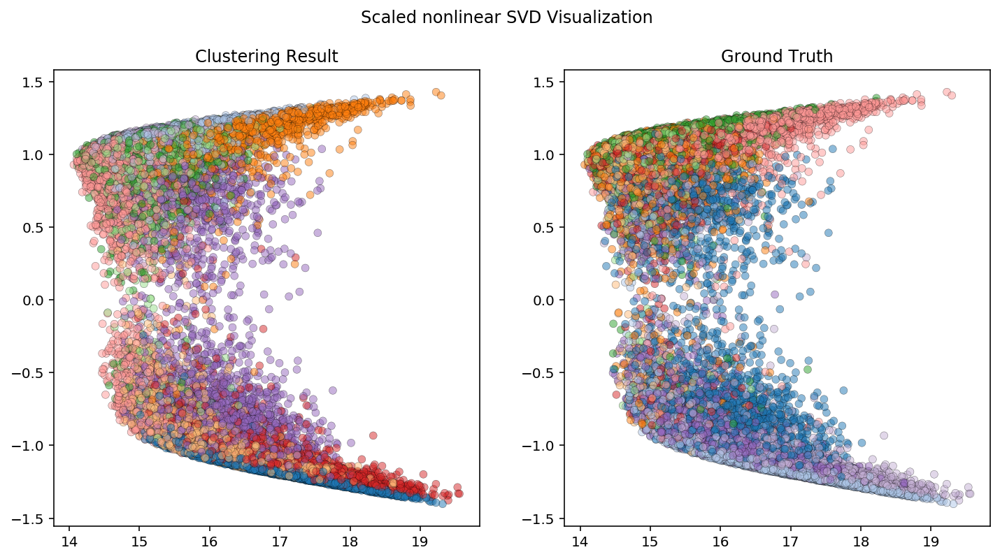

In [16]:
transformed_labels = ['Nonlinear SVD','Scaled SVD','Nonlinear of scaled SVD', 'Scaled nonlinear SVD']

transformed_data = [nonlinear_svd, scaled_svd, nonlinear_scaled_svd, scaled_nonlinear_svd]

transformed_homogeneity_svd = []
transformed_completeness_svd = []
transformed_v_measure_svd = []
transformed_adj_mutual_info_svd = []
transformed_adj_rand_index_svd = []

# Cluster the transformed data
for i in range(len(transformed_labels)):
    print("\n===============================================")
    print("Results for " + transformed_labels[i])
    print("===============================================")

    results, k_means_object = k_means_clustering(transformed_data[i], labels_features,n_clusters=10,random_state=0)
    transformed_homogeneity_svd.append(results['homogeneity'])
    transformed_completeness_svd.append(results['completeness'])
    transformed_v_measure_svd.append(results['v_measure'])
    transformed_adj_mutual_info_svd.append(results['adjusted_mutual_info'])
    transformed_adj_rand_index_svd.append(results['adjusted_rand_index'])
    
    scatter_plot(k_means_object, transformed_data[i], labels_features, transformed_labels[i])


Results for Nonlinear NMF
Show Contingency Matrix:


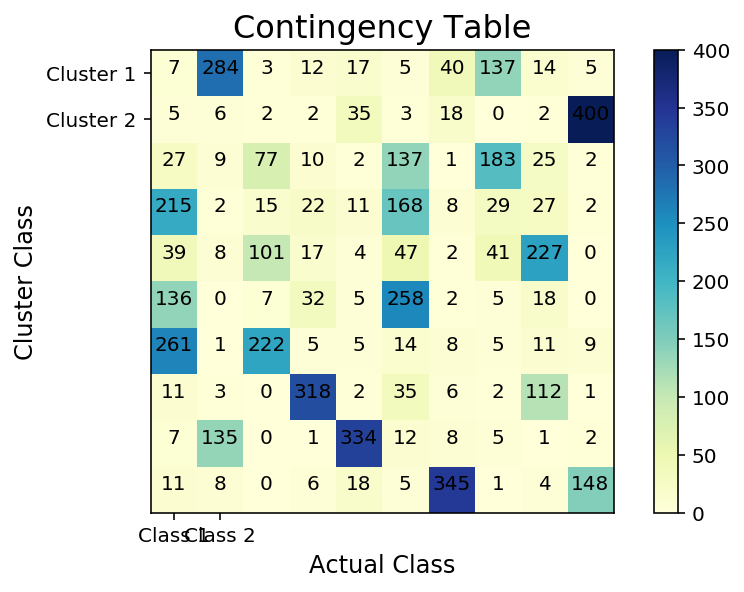

Report 5 Measures for K-Means Clustering
Homogeneity Score: 0.470988
Completeness Score: 0.475305
V-Measure Score: 0.473137
Adjusted Rand Index: 0.344767
Adjusted Mutual Information: 0.471259


<Figure size 432x288 with 0 Axes>

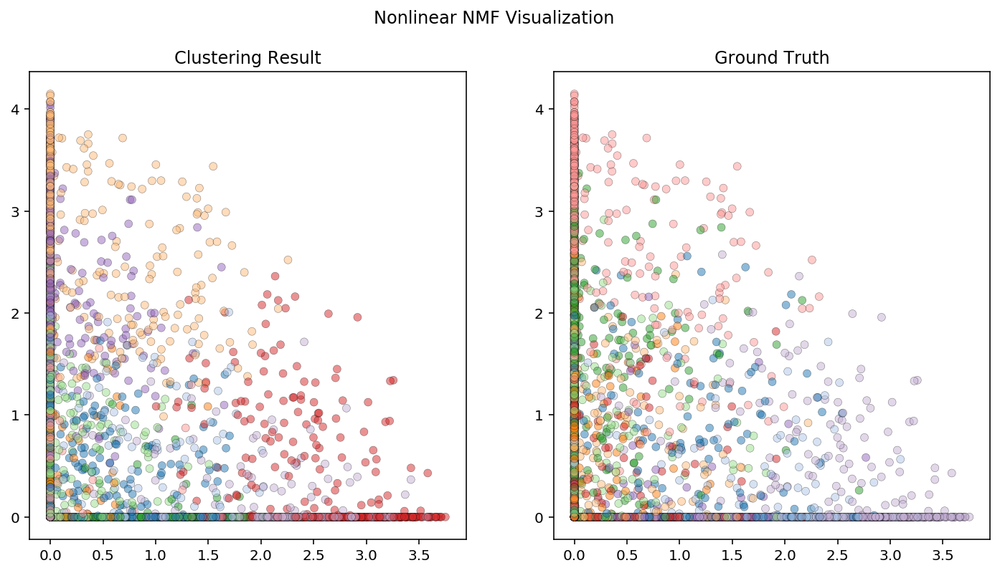


Results for Scaled NMF
Show Contingency Matrix:


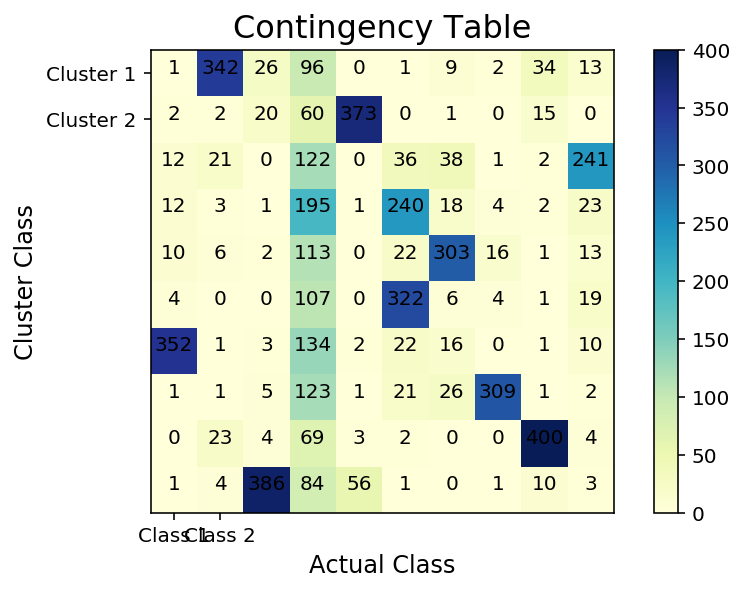

Report 5 Measures for K-Means Clustering
Homogeneity Score: 0.524559
Completeness Score: 0.542904
V-Measure Score: 0.533574
Adjusted Rand Index: 0.385629
Adjusted Mutual Information: 0.531890


<Figure size 432x288 with 0 Axes>

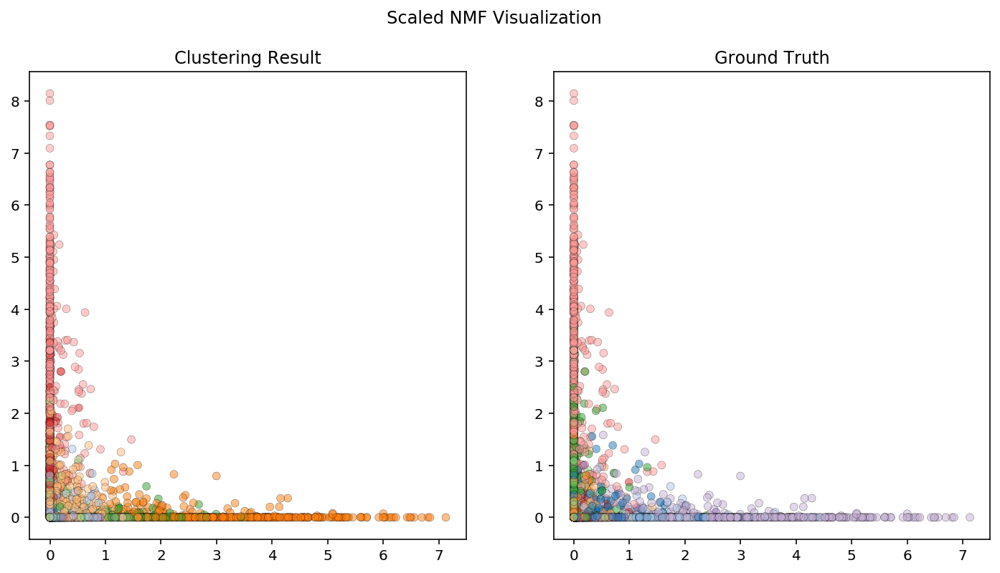


Results for Nonlinear of scaled NMF
Show Contingency Matrix:


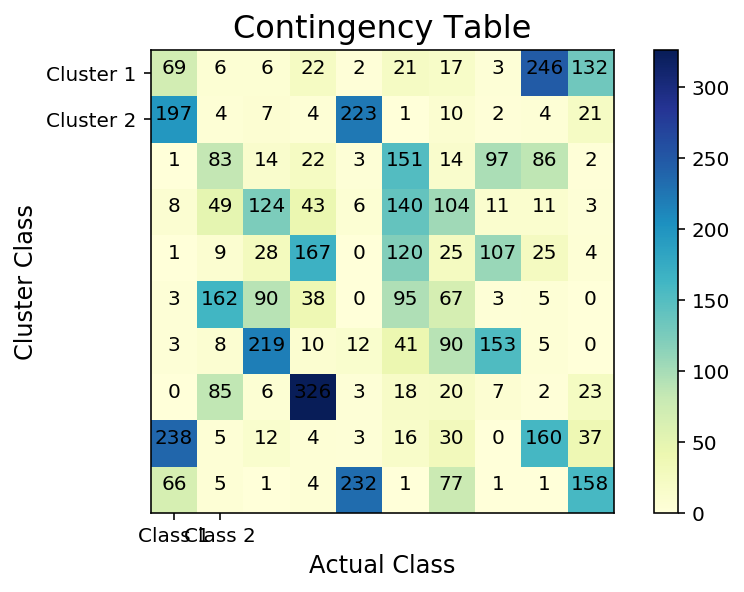

Report 5 Measures for K-Means Clustering
Homogeneity Score: 0.349681
Completeness Score: 0.351820
V-Measure Score: 0.350747
Adjusted Rand Index: 0.212329
Adjusted Mutual Information: 0.348437


<Figure size 432x288 with 0 Axes>

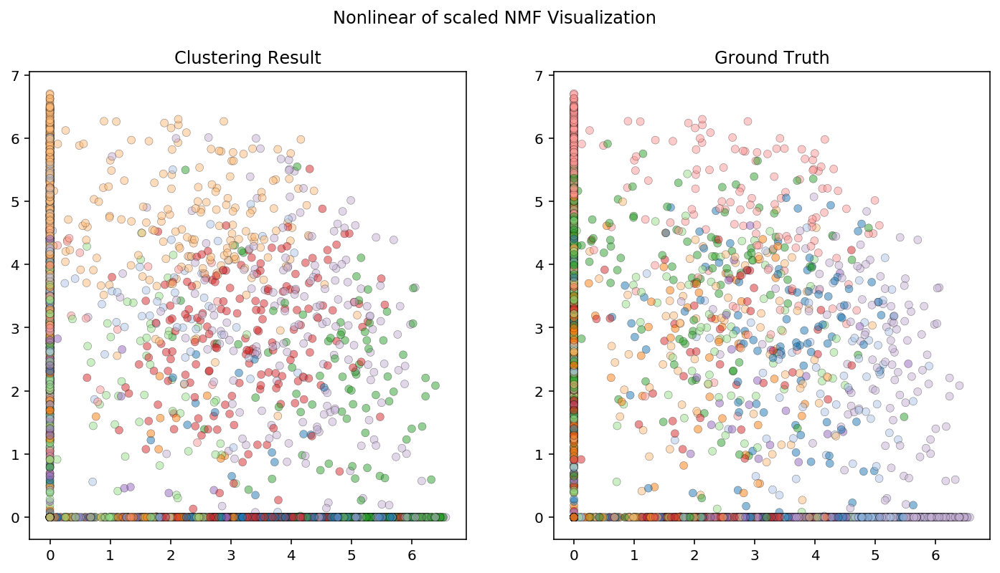


Results for Scaled nonlinear NMF
Show Contingency Matrix:


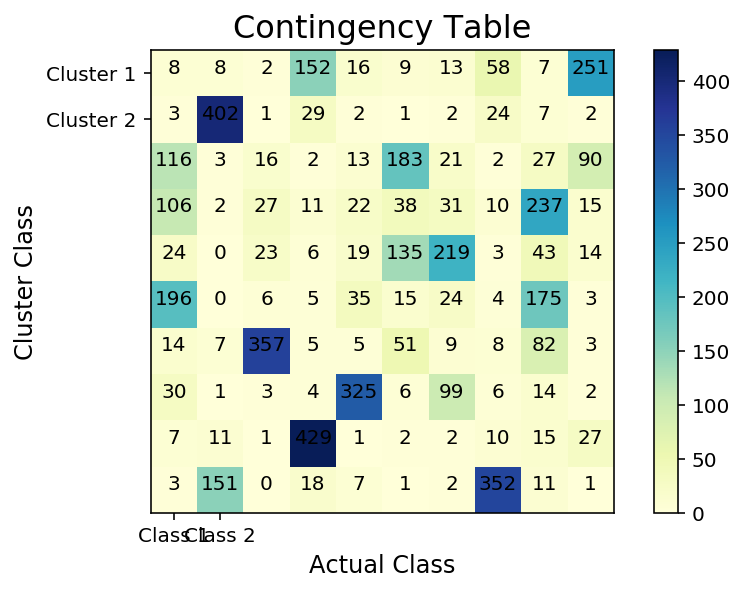

Report 5 Measures for K-Means Clustering
Homogeneity Score: 0.467776
Completeness Score: 0.470349
V-Measure Score: 0.469059
Adjusted Rand Index: 0.371595
Adjusted Mutual Information: 0.467171


<Figure size 432x288 with 0 Axes>

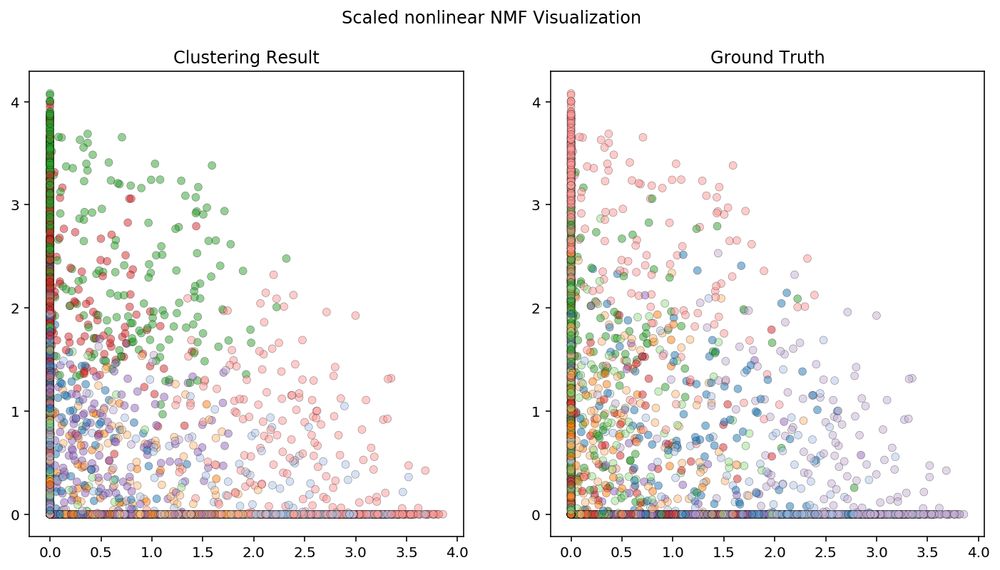

In [17]:
transformed_labels = ['Nonlinear NMF', 'Scaled NMF','Nonlinear of scaled NMF', 'Scaled nonlinear NMF']

transformed_data = [nonlinear_nmf, scaled_nmf, nonlinear_scaled_nmf, scaled_nonlinear_nmf]

transformed_homogeneity_nmf = []
transformed_completeness_nmf = []
transformed_v_measure_nmf = []
transformed_adj_mutual_info_nmf = []
transformed_adj_rand_index_nmf = []

# Cluster the transformed data
for i in range(len(transformed_labels)):
    print("\n===============================================")
    print("Results for " + transformed_labels[i])
    print("===============================================")

    results, k_means_object = k_means_clustering(transformed_data[i], labels_features[:5000],n_clusters=10,random_state=0)
    transformed_homogeneity_nmf.append(results['homogeneity'])
    transformed_completeness_nmf.append(results['completeness'])
    transformed_v_measure_nmf.append(results['v_measure'])
    transformed_adj_mutual_info_nmf.append(results['adjusted_mutual_info'])
    transformed_adj_rand_index_nmf.append(results['adjusted_rand_index'])
    
    scatter_plot(k_means_object, transformed_data[i], labels_features[:5000], transformed_labels[i])